<a href="https://colab.research.google.com/github/alawrence30/Deep-Learning/blob/main/Assignment_02_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>






<img src="https://github.com/djp840/MSDS_458_Public/blob/master/images/NorthwesternHeader.png?raw=1">

## MSDS458 Research Assignment 02 - Part 1
<div class="alert alert-block alert-success">
    <b>More Technical</b>: Throughout the notebook. This types of boxes provide more technical details and extra references about what you are seeing. They contain helpful tips, but you can safely skip them the first time you run through the code.
</div><br>

The CIFAR-10 dataset (Canadian Institute For Advanced Research) is a collection of images that are commonly used to train machine learning and computer vision algorithms. It is one of the most widely used datasets for machine learning research. The CIFAR-10 dataset contains 60,000 32x32 color images in 10 different classes. The 10 different classes represent airplanes, cars, birds, cats, deer, dogs, frogs, horses, ships, and trucks. There are 6,000 images of each class.

<div class="alert alert-block alert-info">
<b>The CIFAR-10 dataset</b><br>
https://www.cs.toronto.edu/~kriz/cifar.html
    </div>

## Imports

In [2]:
import datetime
import time
import numpy as np
import pandas as pd
from packaging import version
from collections import Counter

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization, Dropout, Flatten, Dense
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical

In [3]:
%matplotlib inline
np.set_printoptions(precision=3, suppress=True)

## Verify TensorFlow Version and Keras Version

In [4]:
print("This notebook requires TensorFlow 2.0 or above")
print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >=2

This notebook requires TensorFlow 2.0 or above
TensorFlow version:  2.9.2


In [5]:
print("Keras version: ", keras.__version__)

Keras version:  2.9.0


## Mount Google Drive to Colab environment

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## EDA Functions

In [7]:
def get_three_classes(x, y):
    def indices_of(class_id):
        indices, _ = np.where(y == float(class_id))
        return indices

    indices = np.concatenate([indices_of(0), indices_of(1), indices_of(2)], axis=0)
    
    x = x[indices]
    y = y[indices]
    
    count = x.shape[0]
    indices = np.random.choice(range(count), count, replace=False)
    
    x = x[indices]
    y = y[indices]
    
    y = tf.keras.utils.to_categorical(y)
    
    return x, y

In [8]:
def show_random_examples(x, y, p):
    indices = np.random.choice(range(x.shape[0]), 10, replace=False)
    
    x = x[indices]
    y = y[indices]
    p = p[indices]
    
    plt.figure(figsize=(10, 5))
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.imshow(x[i])
        plt.xticks([])
        plt.yticks([])
        col = 'green' if np.argmax(y[i]) == np.argmax(p[i]) else 'red'
        plt.xlabel(class_names_preview[np.argmax(p[i])], color=col)
    plt.show()

## Research Assignment Reporting Functions

In [9]:
def plot_history(history):
  losses = history.history['loss']
  accs = history.history['accuracy']
  val_losses = history.history['val_loss']
  val_accs = history.history['val_accuracy']
  epochs = len(losses)

  plt.figure(figsize=(16, 4))
  for i, metrics in enumerate(zip([losses, accs], [val_losses, val_accs], ['Loss', 'Accuracy'])):
    plt.subplot(1, 2, i + 1)
    plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
    plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
    plt.legend()
  plt.show()

In [10]:
def print_validation_report(y_test, predictions):
    print("Classification Report")
    print(classification_report(y_test, predictions))
    print('Accuracy Score: {}'.format(accuracy_score(y_test, predictions)))
    print('Root Mean Square Error: {}'.format(np.sqrt(MSE(y_test, predictions)))) 

In [11]:
def plot_confusion_matrix(y_true, y_pred):
    mtx = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8,8))
    sns.heatmap(mtx, annot=True, fmt='d', linewidths=.75,  cbar=False, ax=ax,cmap='Blues',linecolor='white')
    #  square=True,
    plt.ylabel('true label')
    plt.xlabel('predicted label')

## Loading cifar10 Dataset

The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.<br>

The dataset is divided into five training batches and one test batch, each with 10000 images. The test batch contains exactly 1000 randomly-selected images from each class. The training batches contain the remaining images in random order, but some training batches may contain more images from one class than another. Between them, the training batches contain exactly 5000 images from each class.


In [12]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 [==============================] - 14s 0us/step


* Tuple of Numpy arrays: (x_train, y_train), (x_test, y_test).
* x_train, x_test: uint8 arrays of color image data with shapes (num_samples, 32, 32).
* y_train, y_test: uint8 arrays of digit labels (integers in range 0-9)

## EDA Training and Test Datasets

* Imported 50000 examples for training and 10000 examples for test 
* Imported 50000 labels for training and 10000 labels for test 

In [13]:
print('train_images:\t{}'.format(x_train.shape))
print('train_labels:\t{}'.format(y_train.shape))
print('test_images:\t\t{}'.format(x_test.shape))
print('test_labels:\t\t{}'.format(y_test.shape))

train_images:	(50000, 32, 32, 3)
train_labels:	(50000, 1)
test_images:		(10000, 32, 32, 3)
test_labels:		(10000, 1)


## Review Labels 

In [14]:
print("First ten labels training dataset:\n {}\n".format(y_train[0:10]))
print("This output the numeric label, need to convert to item description")

First ten labels training dataset:
 [[6]
 [9]
 [9]
 [4]
 [1]
 [1]
 [2]
 [7]
 [8]
 [3]]

This output the numeric label, need to convert to item description


## Plot Subset of Examples

In [15]:
(train_images, train_labels),(test_images, test_labels)= tf.keras.datasets.cifar10.load_data()

In [16]:
x_preview, y_preview = get_three_classes(train_images, train_labels)
x_preview, y_preview = get_three_classes(test_images, test_labels)

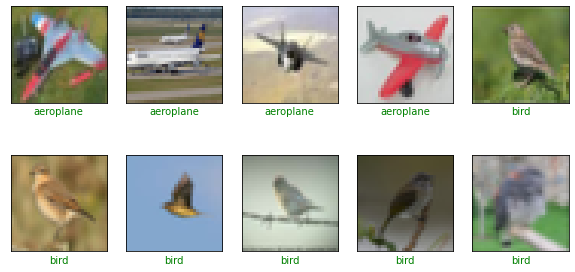

In [17]:
class_names_preview = ['aeroplane', 'car', 'bird']

show_random_examples(x_preview, y_preview, y_preview)

## Preprocessing Data for Model Development

The labels are an array of integers, ranging from 0 to 9. These correspond to the class of clothing the image represents:

|Label  |Class_  |
|-------|--------|
|0|	airplane     |
|1|	automobile   |
|2|	bird         |
|3|	cat          |
|4|	deer         |
|5|	dog          |
|6|	frog         |
|7|	horse        |
|8|	ship         |
|9|	truck        |

In [18]:
class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog' 
,'horse'
,'ship'
,'truck']

## Create Validation Data Set

In [19]:
x_train_split, x_valid_split, y_train_split, y_valid_split = train_test_split(x_train
                                                                              ,y_train
                                                                              ,test_size=.1
                                                                              ,random_state=42
                                                                              ,shuffle=True)

## Confirm Datasets {Train, Validation, Test}

In [20]:
print(x_train_split.shape, x_valid_split.shape, x_test.shape)

(45000, 32, 32, 3) (5000, 32, 32, 3) (10000, 32, 32, 3)


## Rescale Examples  {Train, Validation, Test}
The images are 28x28 NumPy arrays, with pixel values ranging from 0 to 255
 

1. Each element in each example is a pixel value
2. Pixel values range from 0 to 255
3. 0 = black
4. 255 = white

In [21]:
x_train_norm = x_train_split/255
x_valid_norm = x_valid_split/255
x_test_norm = x_test/255

print(x_train_norm.shape, x_valid_norm.shape, x_test_norm.shape)

(45000, 32, 32, 3) (5000, 32, 32, 3) (10000, 32, 32, 3)


## Create the Model

<img src="https://github.com/djp840/MSDS_458_Public/blob/master/images/CNN_architecture_v4.png?raw=1">


##Experiment 1: DNN with 2 layers (no regularization)

Hidden layer 1: 100 neurons

Hidden layer 2: 150 neurons

Ouput layer: 10 neurons (one for each image)

####Build, Compile, Train, Evaluate

In [22]:
## Variation 1 - did not train
#model_1 = Sequential()
#model_1.add(Dense(input_shape = [32,32,3], units = 100, activation = 'relu', ))
#model_1.add(Dense(units = 150, activation = 'relu'))
#model_1.add(Dense(name = "output_layer", units = 10, activation = 'softmax'))
#model_1.summary()

In [23]:
## Variation 2 - trained 
from time import perf_counter 
model_1 = Sequential()
model_1.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_1.add(layers.Dense(units = 100, activation = "relu"))
model_1.add(layers.Dense(units = 150, activation = "relu"))
model_1.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 100)               307300    
                                                                 
 dense_1 (Dense)             (None, 150)               15150     
                                                                 
 output_layer (Dense)        (None, 10)                1510      
                                                                 
Total params: 323,960
Trainable params: 323,960
Non-trainable params: 0
_________________________________________________________________


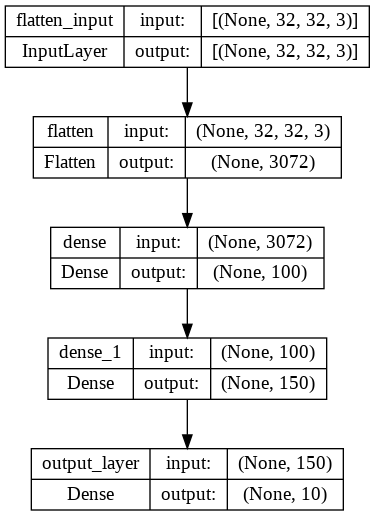

In [24]:
keras.utils.plot_model(model_1, "CIFAR_model.png", show_shapes=True) 

In [25]:
## Compile

model_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [26]:
## Train 
time = perf_counter()

history_1 = model_1.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_1.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 5s 3ms/step - loss: 1.8718 - accuracy: 0.3235 - val_loss: 1.7594 - val_accuracy: 0.3612
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.7074 - accuracy: 0.3870 - val_loss: 1.6989 - val_accuracy: 0.3862
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6328 - accuracy: 0.4159 - val_loss: 1.6259 - val_accuracy: 0.4170
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5887 - accuracy: 0.4316 - val_loss: 1.6059 - val_accuracy: 0.4174
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5505 - accuracy: 0.4444 - val_loss: 1.6058 - val_accuracy: 0.4162
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5213 - accuracy: 0.4573 - val_loss: 1.5609 - val_accuracy: 0.4410
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5020 - accuracy: 0.4627 - val_loss: 1.5288 - val_accuracy: 0.4466

In [27]:
time_1 = perf_counter() - time
print(time_1)

28.06218623699999


In [28]:
## Evaluate

model_1 = tf.keras.models.load_model("DNN_model_1.h5")
print(f"Test acc: {model_1.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.4795 - accuracy: 0.4753
Test acc: 0.475


#### Plot Metrics

In [29]:
history_dict_1 = history_1.history
history_dict_1.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [30]:
history_df_1=pd.DataFrame(history_dict_1)
history_df_1.tail().round(3)

,loss,accuracy,val_loss,val_accuracy
7,1.481,0.472,1.525,0.455
8,1.467,0.474,1.514,0.463
9,1.447,0.481,1.521,0.457
10,1.432,0.490,1.507,0.463
11,1.419,0.494,1.523,0.457


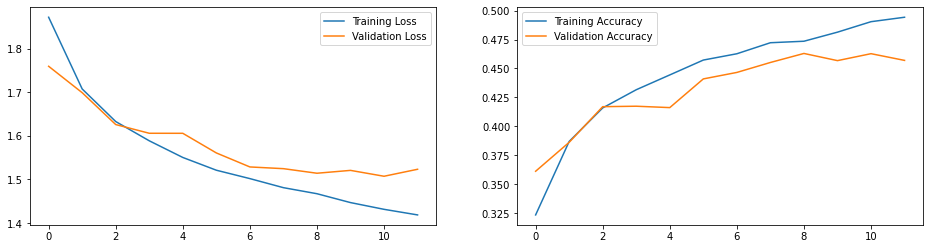

In [31]:
## Loss and acuracy
plot_history(history_1)

In [32]:
## Confusion matrix
pred_1= model_1.predict(x_test_norm)
pred_1=np.argmax(pred_1, axis=1)

313/313 [==============================] - 1s 1ms/step


313/313 [==============================] - 0s 1ms/step


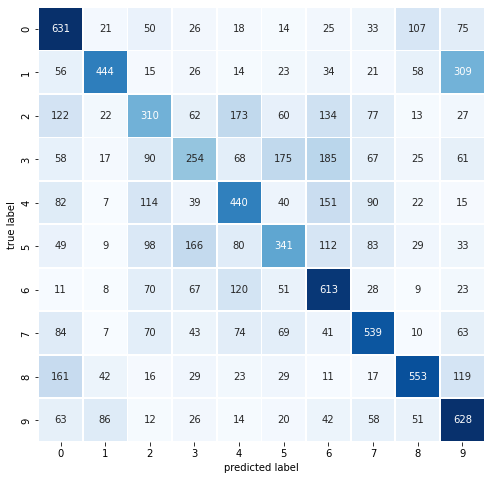

In [33]:
# Get the predicted classes:
pred_classes_1 = np.argmax(model_1.predict(x_test_norm), axis=-1)
pred_classes_1;

conf_mx_1 = tf.math.confusion_matrix(y_test, pred_classes_1)
conf_mx_1;

plot_confusion_matrix(y_test,pred_classes_1)

#### Activation and Performance

In [34]:
# Extracts the outputs of all layers:
layer_outputs_1 = [layer.output for layer in model_1.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_1 = models.Model(inputs=model_1.input, outputs=layer_outputs_1)

# Get activation values for the last dense layer
activations_1 = activation_model_1.predict(x_valid_norm[:3250])
dense_layer_activations_1 = activations_1[-3]
output_layer_activations_1 = activations_1[-1]

102/102 [==============================] - 0s 1ms/step


In [35]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_1 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_1 = tsne_1.fit_transform(dense_layer_activations_1)

# Scaling
tsne_results_1 = (tsne_results_1 - tsne_results_1.min()) / (tsne_results_1.max() - tsne_results_1.min())

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3250 samples in 0.001s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed neighbors for 3250 samples in 0.249s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3250
[t-SNE] Computed conditional probabilities for sample 2000 / 3250
[t-SNE] Computed conditional probabilities for sample 3000 / 3250
[t-SNE] Computed conditional probabilities for sample 3250 / 3250
[t-SNE] Mean sigma: 4.280940
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.039093
[t-SNE] KL divergence after 300 iterations: 2.420412


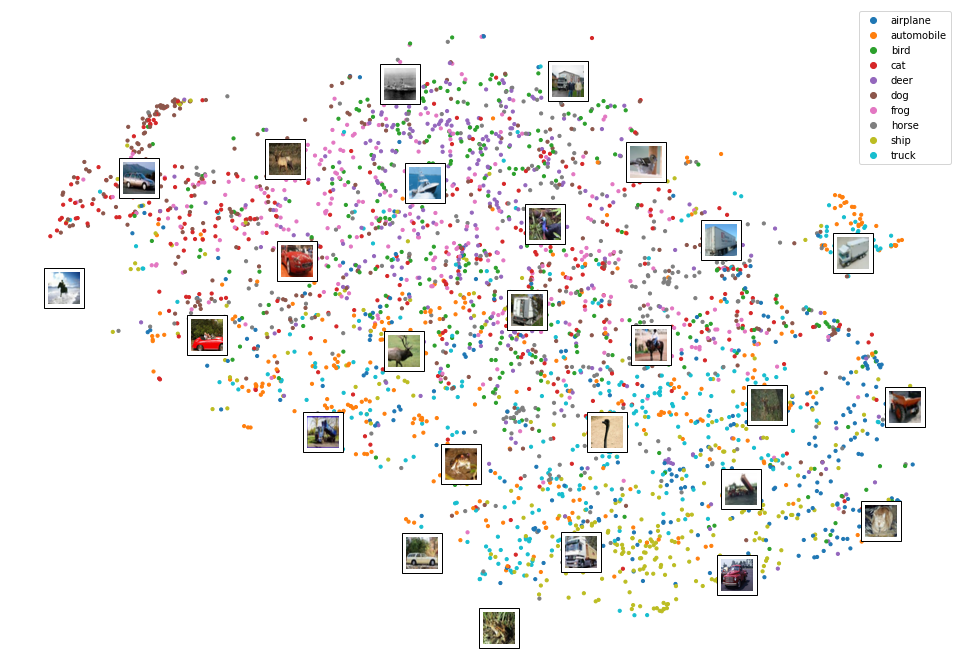

In [36]:
cmap_1 = plt.cm.tab10
plt.figure(figsize=(17,12))
scatter_1 = plt.scatter(tsne_results_1[:,0],tsne_results_1[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_1)
plt.legend(handles=scatter_1.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_1):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

##Experiment 2: DNN with 3 layers (no regularization)

Hidden layer 1: 100

Hidden layer 2: 150

Hidden layer 3: 75

Output layer: 10 (one for each image)

#### Build, Compile, Train, Evaluate

In [37]:
model_2 = Sequential()
model_2.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_2.add(layers.Dense(units = 100, activation = "relu"))
model_2.add(layers.Dense(units = 250, activation = "relu"))
model_2.add(layers.Dense(units = 150, activation = "relu"))
model_2.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 3072)              0         
                                                                 
 dense_2 (Dense)             (None, 100)               307300    
                                                                 
 dense_3 (Dense)             (None, 250)               25250     
                                                                 
 dense_4 (Dense)             (None, 150)               37650     
                                                                 
 output_layer (Dense)        (None, 10)                1510      
                                                                 
Total params: 371,710
Trainable params: 371,710
Non-trainable params: 0
_________________________________________________________________


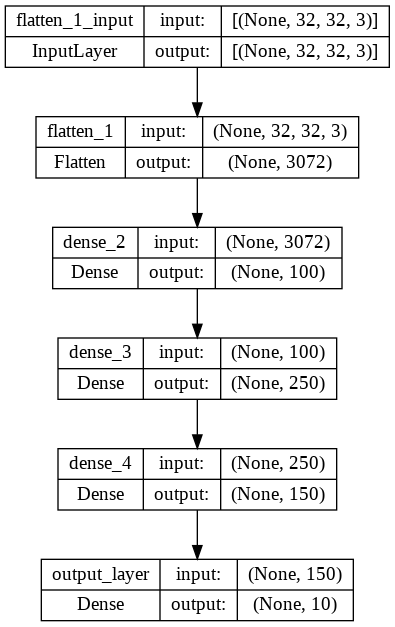

In [38]:
keras.utils.plot_model(model_2, "CIFAR_model.png", show_shapes=True) 

In [39]:
## Compile

model_2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [40]:
## Train 
time = perf_counter()

history_2 = model_2.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_2.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 3ms/step - loss: 1.8633 - accuracy: 0.3221 - val_loss: 1.8060 - val_accuracy: 0.3520
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6919 - accuracy: 0.3916 - val_loss: 1.6756 - val_accuracy: 0.3902
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6144 - accuracy: 0.4210 - val_loss: 1.5969 - val_accuracy: 0.4166
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5534 - accuracy: 0.4453 - val_loss: 1.5609 - val_accuracy: 0.4348
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5103 - accuracy: 0.4603 - val_loss: 1.5583 - val_accuracy: 0.4422
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4781 - accuracy: 0.4734 - val_loss: 1.5398 - val_accuracy: 0.4434
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4528 - accuracy: 0.4800 - val_loss: 1.5174 - val_accuracy: 0.4552

In [41]:
time_2 = perf_counter() - time
print(time_2)

26.388039200000094


In [42]:
## Evaluate

model_2 = tf.keras.models.load_model("DNN_model_2.h5")
print(f"Test acc: {model_2.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.4538 - accuracy: 0.4860
Test acc: 0.486


#### Plot Metrics

In [43]:
history_dict_2 = history_2.history
history_dict_2.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [44]:
history_df_2=pd.DataFrame(history_dict_2)
history_df_2.tail().round(3)

,loss,accuracy,val_loss,val_accuracy
7,1.423,0.489,1.537,0.450
8,1.402,0.498,1.486,0.464
9,1.376,0.510,1.493,0.463
10,1.357,0.515,1.513,0.463
11,1.336,0.523,1.526,0.451


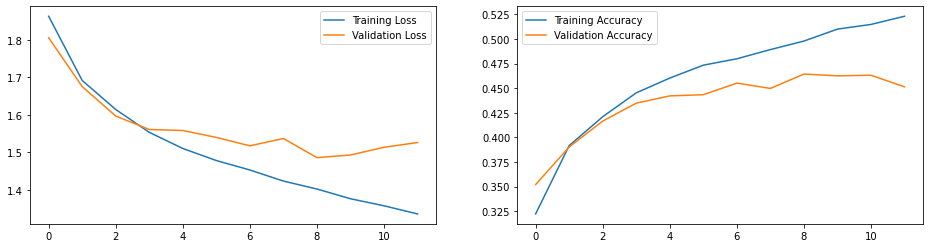

In [45]:
## Loss and acuracy
plot_history(history_2)

In [46]:
## Confusion matrix
pred_2= model_2.predict(x_test_norm)
pred_2=np.argmax(pred_2, axis=1)

313/313 [==============================] - 1s 2ms/step


313/313 [==============================] - 0s 1ms/step


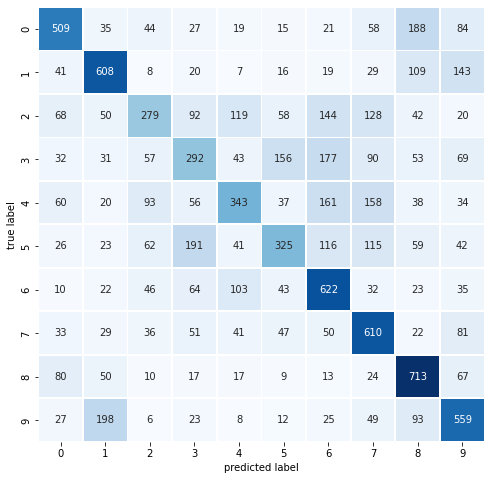

In [47]:
# Get the predicted classes:
pred_classes_2 = np.argmax(model_2.predict(x_test_norm), axis=-1)
pred_classes_2;

conf_mx_2 = tf.math.confusion_matrix(y_test, pred_classes_2)
conf_mx_2;

plot_confusion_matrix(y_test,pred_classes_2)

#### Activation and Performance

In [48]:
# Extracts the outputs of all layers:
layer_outputs_2 = [layer.output for layer in model_2.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_2 = models.Model(inputs=model_2.input, outputs=layer_outputs_2)

# Get activation values for the last dense layer
activations_2 = activation_model_2.predict(x_valid_norm[:3250])
dense_layer_activations_2 = activations_2[-3]
output_layer_activations_2 = activations_2[-1]

102/102 [==============================] - 0s 1ms/step


In [49]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_2 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_2 = tsne_2.fit_transform(dense_layer_activations_2)

# Scaling
tsne_results_2 = (tsne_results_2 - tsne_results_2.min()) / (tsne_results_2.max() - tsne_results_2.min())

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3250 samples in 0.002s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed neighbors for 3250 samples in 0.272s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3250
[t-SNE] Computed conditional probabilities for sample 2000 / 3250
[t-SNE] Computed conditional probabilities for sample 3000 / 3250
[t-SNE] Computed conditional probabilities for sample 3250 / 3250
[t-SNE] Mean sigma: 2.869316
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.606575
[t-SNE] KL divergence after 300 iterations: 2.305969


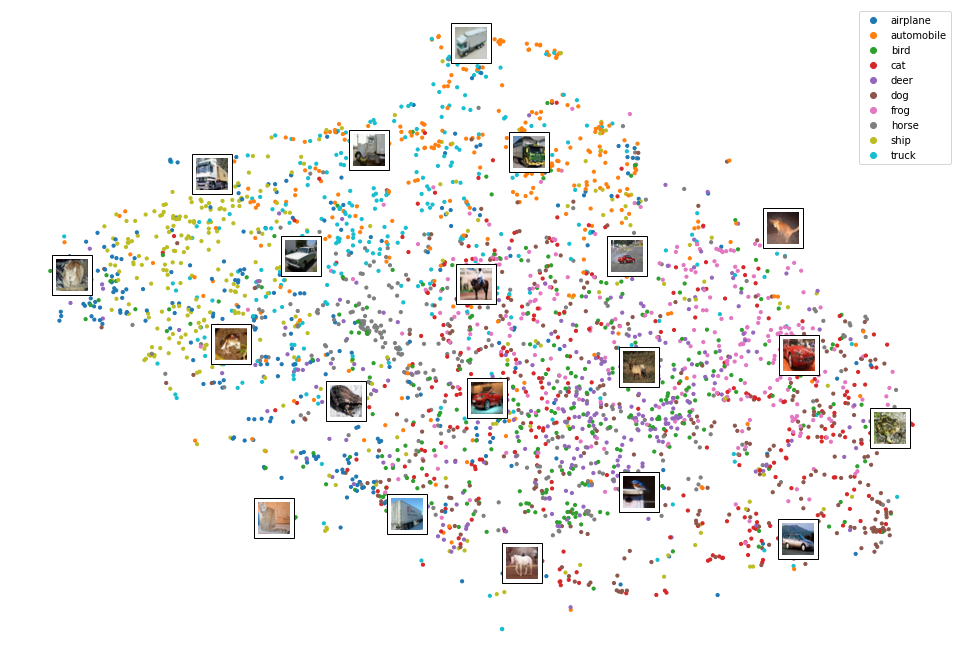

In [50]:
cmap_2 = plt.cm.tab10
plt.figure(figsize=(17,12))
scatter_2 = plt.scatter(tsne_results_2[:,0],tsne_results_2[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_2)
plt.legend(handles=scatter_2.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_2):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

##Experiment 3: CNN with 2 convolution/max pooling layers (no regularization)

Layer 1: 128

Layer 2: 256

Layer: 384

#### Build, Compile, Train, Evaluate

In [51]:
## Build CNN

model_3 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), # Layer 1 start
  MaxPool2D((2, 2),strides=2), # Layer 1 end
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), # Layer 2 start
  MaxPool2D((2, 2),strides=2), # Layer 2 end
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification 
  Dense(units=10, activation=tf.nn.softmax)       
])

model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 128)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 256)        0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 9216)              0         
                                                                 
 dense_5 (Dense)             (None, 384)              

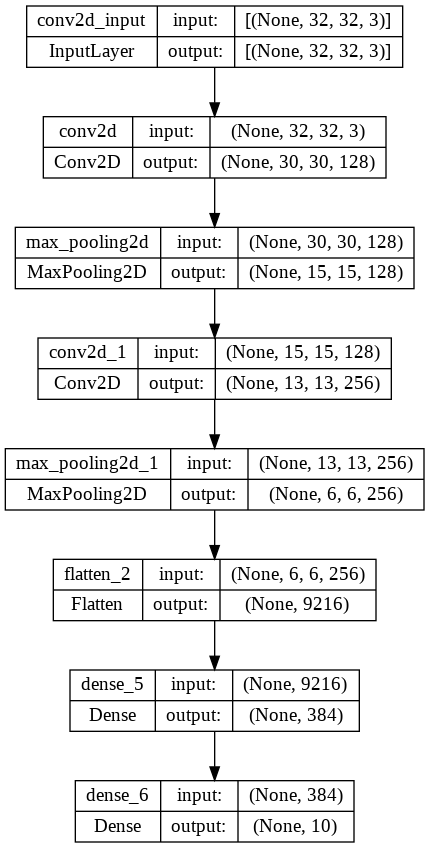

In [52]:
keras.utils.plot_model(model_3, "CIFAR10.png", show_shapes=True) 

In [53]:
## Compile

model_3.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [54]:
## Train 
time = perf_counter()

history_3 = model_3.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_3.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 14s 10ms/step - loss: 2.1644 - accuracy: 0.1692 - val_loss: 2.0593 - val_accuracy: 0.1738
Epoch 2/200
704/704 [==============================] - 7s 10ms/step - loss: 2.0005 - accuracy: 0.1875 - val_loss: 1.9492 - val_accuracy: 0.1952
Epoch 3/200
704/704 [==============================] - 7s 10ms/step - loss: 1.9141 - accuracy: 0.2340 - val_loss: 1.8695 - val_accuracy: 0.2522
Epoch 4/200
704/704 [==============================] - 7s 10ms/step - loss: 1.8076 - accuracy: 0.2724 - val_loss: 1.7690 - val_accuracy: 0.2742
Epoch 5/200
704/704 [==============================] - 7s 10ms/step - loss: 1.7315 - accuracy: 0.2914 - val_loss: 1.7326 - val_accuracy: 0.3028
Epoch 6/200
704/704 [==============================] - 7s 10ms/step - loss: 1.6730 - accuracy: 0.3228 - val_loss: 1.6400 - val_accuracy: 0.3382
Epoch 7/200
704/704 [==============================] - 7s 10ms/step - loss: 1.5684 - accuracy: 0.3656 - val_loss: 1.5599 - val_accuracy

In [55]:
time_3 = perf_counter() - time
print(time_3)

271.87023625300003


In [56]:
## Evaluate

model_3 = tf.keras.models.load_model("CNN_model_3.h5")
print(f"Test acc: {model_3.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 3ms/step - loss: 1.1932 - accuracy: 0.6230
Test acc: 0.623


#### Plot Metrics

In [57]:
history_dict_3 = history_3.history
history_dict_3.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [58]:
history_df_3=pd.DataFrame(history_dict_3)
history_df_3.tail().round(3)

,loss,accuracy,val_loss,val_accuracy
34,0.646,0.803,1.253,0.620
35,0.632,0.809,1.245,0.647
36,0.615,0.816,1.251,0.645
37,0.607,0.819,1.241,0.645
38,0.589,0.826,1.258,0.644


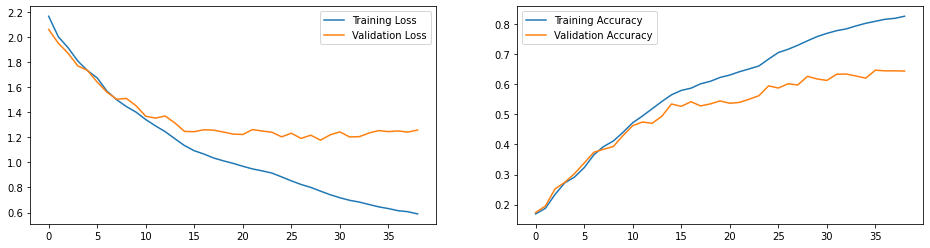

In [59]:
## Loss and acuracy
plot_history(history_3)

In [60]:
## Confusion matrix
pred_3= model_3.predict(x_test_norm)
pred_3=np.argmax(pred_3, axis=1)

313/313 [==============================] - 1s 2ms/step


313/313 [==============================] - 1s 2ms/step


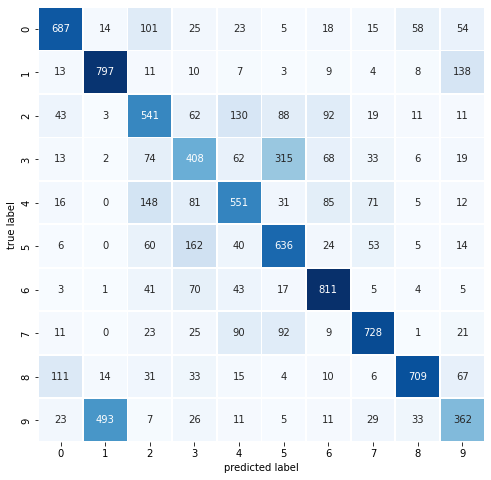

In [61]:
# Get the predicted classes:
pred_classes_3 = np.argmax(model_3.predict(x_test_norm), axis=-1)
pred_classes_3;

conf_mx_3 = tf.math.confusion_matrix(y_test, pred_classes_3)
conf_mx_3;

plot_confusion_matrix(y_test,pred_classes_3)

#### Activation and Performance

In [62]:
# Extracts the outputs of all layers:
layer_outputs_3 = [layer.output for layer in model_3.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_3 = models.Model(inputs=model_3.input, outputs=layer_outputs_3)

# Get activation values for the last dense layer
activations_3 = activation_model_3.predict(x_valid_norm[:3250])
dense_layer_activations_3 = activations_3[-3]
output_layer_activations_3 = activations_3[-1]

102/102 [==============================] - 0s 2ms/step


In [63]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_3 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_3 = tsne_3.fit_transform(dense_layer_activations_3)

# Scaling
tsne_results_3 = (tsne_results_3 - tsne_results_3.min()) / (tsne_results_3.max() - tsne_results_3.min())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3250 samples in 0.021s...
[t-SNE] Computed neighbors for 3250 samples in 2.501s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3250
[t-SNE] Computed conditional probabilities for sample 2000 / 3250
[t-SNE] Computed conditional probabilities for sample 3000 / 3250
[t-SNE] Computed conditional probabilities for sample 3250 / 3250
[t-SNE] Mean sigma: 4.476885
[t-SNE] KL divergence after 250 iterations with early exaggeration: 138.757492
[t-SNE] KL divergence after 300 iterations: 5.443390


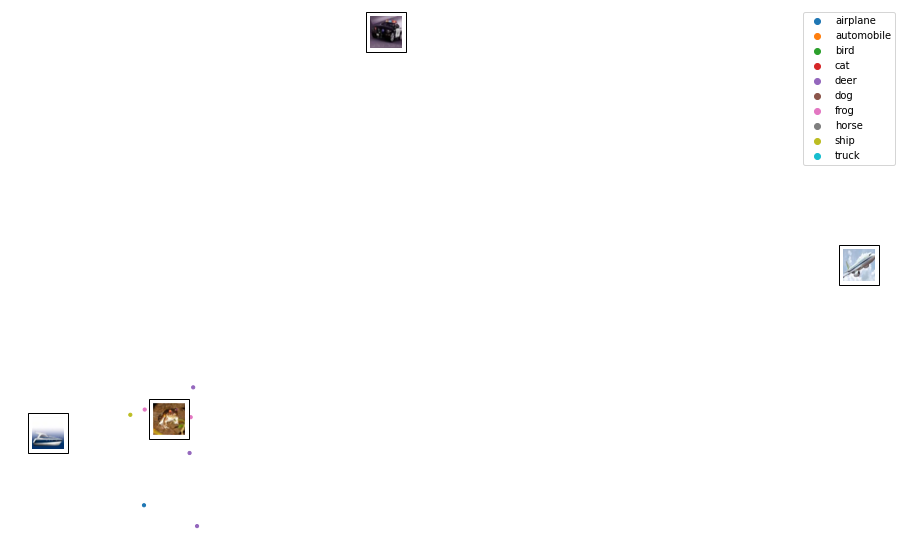

In [64]:
cmap_3 = plt.cm.tab10
plt.figure(figsize=(16,10))
scatter_3 = plt.scatter(tsne_results_3[:,0],tsne_results_3[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_3)
plt.legend(handles=scatter_3.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_3):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

#### Predictions

In [65]:
model_3 = tf.keras.models.load_model('CNN_model_3.h5')
preds_3 = model_3.predict(x_test_norm)
preds_3.shape

313/313 [==============================] - 1s 2ms/step


(10000, 10)

In [66]:
cm_3 = sns.light_palette((260, 75, 60), input="husl", as_cmap=True)

In [67]:
df_3 = pd.DataFrame(preds_3[0:20], columns = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'])
df_3.style.format("{:.2%}").background_gradient(cmap=cm_3)

,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
0,0.09%,0.03%,2.58%,45.22%,0.07%,51.20%,0.53%,0.04%,0.14%,0.11%
1,27.25%,16.15%,0.85%,0.61%,0.12%,0.10%,0.31%,0.33%,26.40%,27.88%
2,2.57%,23.47%,0.67%,1.09%,0.21%,0.18%,0.53%,0.31%,7.76%,63.20%
3,85.25%,0.40%,2.51%,0.31%,0.32%,0.05%,0.10%,0.15%,10.17%,0.73%
4,0.02%,0.03%,0.60%,0.68%,2.67%,0.04%,95.93%,0.01%,0.01%,0.01%
5,0.01%,0.02%,0.37%,0.48%,1.04%,0.04%,98.01%,0.01%,0.01%,0.01%
6,0.14%,62.40%,0.02%,0.03%,0.00%,0.01%,0.04%,0.02%,0.17%,37.17%
7,0.67%,0.22%,16.27%,4.75%,22.93%,0.80%,54.00%,0.14%,0.07%,0.15%
8,1.07%,0.06%,7.28%,31.07%,15.89%,34.96%,2.31%,5.22%,0.29%,1.85%
9,0.91%,52.95%,0.11%,0.15%,0.02%,0.03%,0.14%,0.08%,0.85%,44.77%


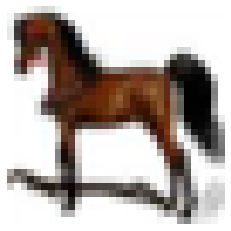

In [68]:
(_,_), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

img_3 = test_images[2004]
img_tensor_3 = image.img_to_array(img_3)
img_tensor_3 = np.expand_dims(img_tensor_3, axis=0)

class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog' 
,'horse'
,'ship'
,'truck']

plt.imshow(img_3, cmap='viridis')
plt.axis('off')
plt.show()

In [69]:
# Extracts the outputs of the top 8 layers:
layer_outputs_3 = [layer.output for layer in model_3.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model_3 = models.Model(inputs=model_3.input, outputs=layer_outputs_3)

In [70]:
activations_3 = activation_model_3.predict(img_tensor_3)
len(activations_3)

1/1 [==============================] - 0s 96ms/step


7

In [71]:
layer_names = []
for layer in model_3.layers:
    layer_names.append(layer.name)
    
layer_names

['conv2d',
 'max_pooling2d',
 'conv2d_1',
 'max_pooling2d_1',
 'flatten_2',
 'dense_5',
 'dense_6']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


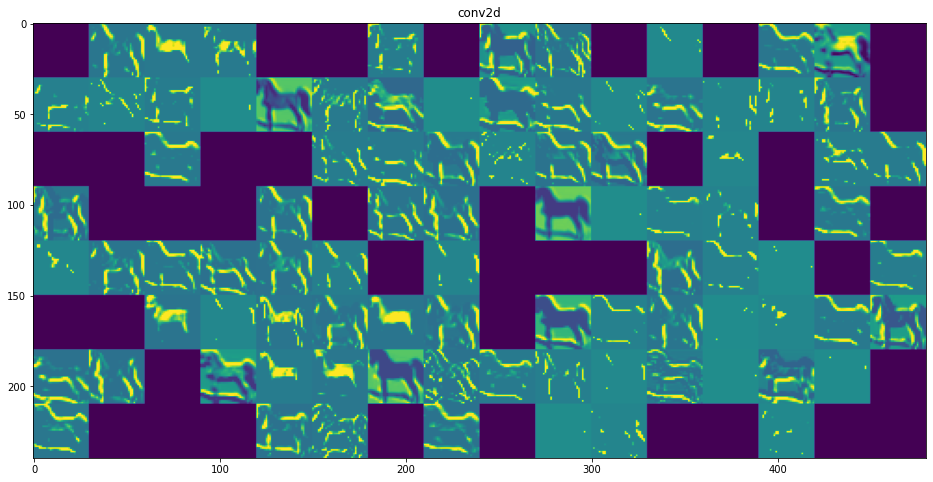

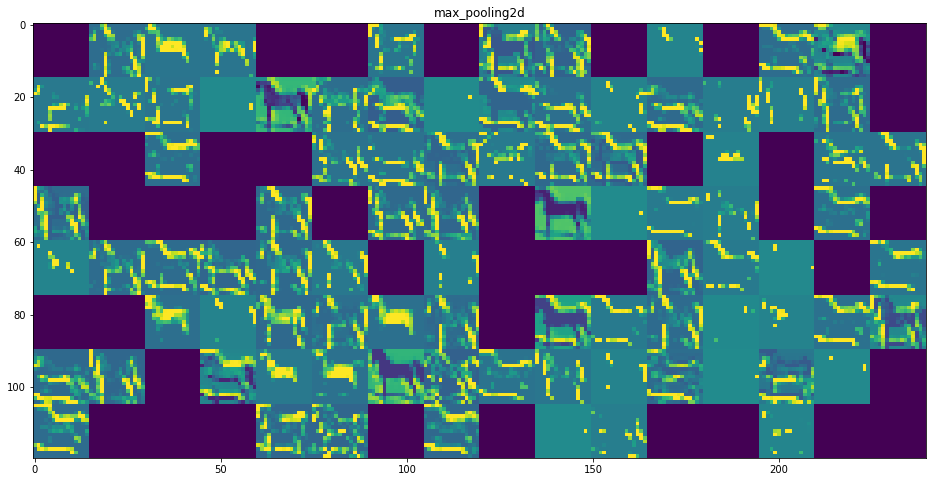

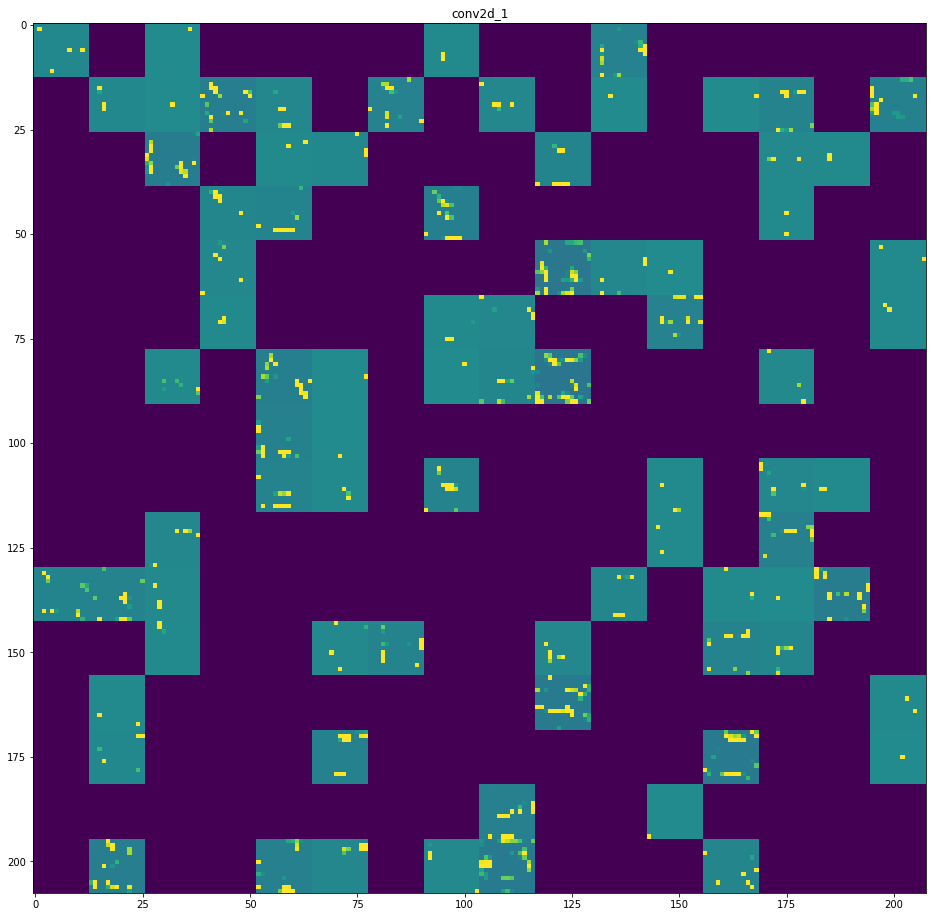

In [72]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model_3.layers[:3]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations_3):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show();

##Experiment 4: CNN with 2 convolution/max pooling layers (no regularization)

Layer 1: 128

Layer 2: 256

Layer 3: 512

Layer: 384

#### Build, Compile, Train, Evaluate

In [73]:
## Build CNN

model_4 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), #Start of Layer 1
  MaxPool2D((2, 2),strides=2), #End of Layer 1
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), #Start of Layer 2
  MaxPool2D((2, 2),strides=2), #End of Layer 2
  Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), #Start of Layer 3
  MaxPool2D((2, 2),strides=2), #End of Layer 3
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification
  BatchNormalization(),
  Dense(units=10, activation=tf.nn.softmax)       
])
model_4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 15, 15, 128)      0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 6, 6, 256)        0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 4, 4, 512)         1180160   
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 2, 2, 512)       

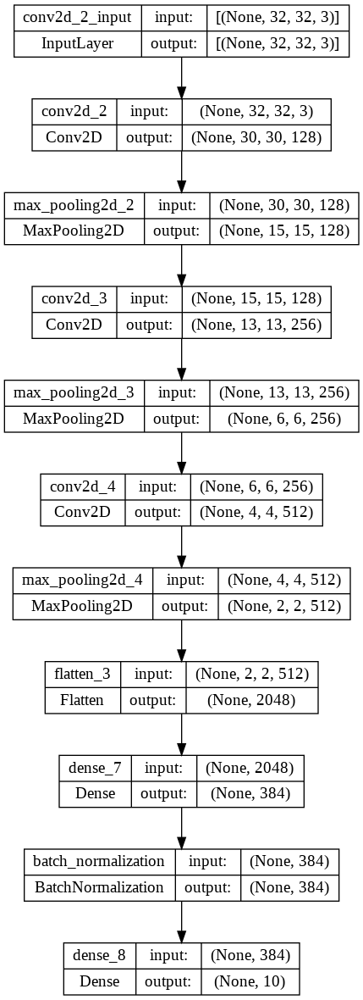

In [74]:
keras.utils.plot_model(model_4, "CIFAR10.png", show_shapes=True) 

In [75]:
## Compile
model_4.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [76]:
## Train
time = perf_counter()

history_4 = model_4.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_4.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 9s 12ms/step - loss: 1.5235 - accuracy: 0.4684 - val_loss: 1.5510 - val_accuracy: 0.4816
Epoch 2/200
704/704 [==============================] - 8s 11ms/step - loss: 1.0949 - accuracy: 0.6320 - val_loss: 1.0291 - val_accuracy: 0.6596
Epoch 3/200
704/704 [==============================] - 8s 11ms/step - loss: 0.9027 - accuracy: 0.7081 - val_loss: 0.9558 - val_accuracy: 0.6810
Epoch 4/200
704/704 [==============================] - 8s 11ms/step - loss: 0.7743 - accuracy: 0.7545 - val_loss: 0.9532 - val_accuracy: 0.7014
Epoch 5/200
704/704 [==============================] - 8s 11ms/step - loss: 0.6660 - accuracy: 0.7923 - val_loss: 0.9150 - val_accuracy: 0.7148
Epoch 6/200
704/704 [==============================] - 8s 11ms/step - loss: 0.5834 - accuracy: 0.8252 - val_loss: 0.9742 - val_accuracy: 0.7040
Epoch 7/200
704/704 [==============================] - 8s 11ms/step - loss: 0.5047 - accuracy: 0.8523 - val_loss: 0.8563 - val_accuracy:

In [77]:
time_4 = perf_counter() - time
print(time_4)

81.73962926600007


In [78]:
## Evalute

model_4 = tf.keras.models.load_model("CNN_model_4.h5")
print(f"Test acc: {model_4.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 4ms/step - loss: 0.8886 - accuracy: 0.7490
Test acc: 0.749


#### Plot Metrics

In [79]:
history_dict_4 = history_4.history
history_dict_4.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [80]:
history_df_4=pd.DataFrame(history_dict_4)
history_df_4.tail().round(3)

,loss,accuracy,val_loss,val_accuracy
5,0.583,0.825,0.974,0.704
6,0.505,0.852,0.856,0.755
7,0.439,0.877,1.049,0.714
8,0.388,0.895,1.039,0.745
9,0.340,0.913,1.038,0.743


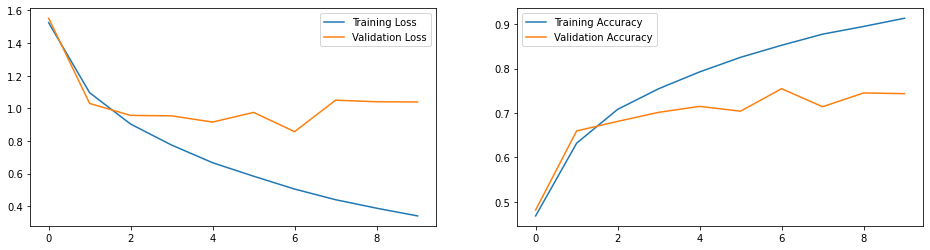

In [81]:
## Loss and acuracy
plot_history(history_4)

In [82]:
## Confusion matrix
pred_4= model_4.predict(x_test_norm)
pred_4=np.argmax(pred_4, axis=1)

313/313 [==============================] - 1s 3ms/step


313/313 [==============================] - 1s 3ms/step


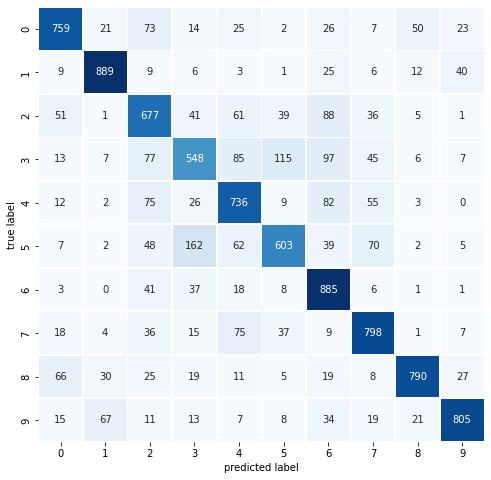

In [83]:
# Get the predicted classes:
pred_classes_4 = np.argmax(model_4.predict(x_test_norm), axis=-1)
pred_classes_4;

conf_mx_4 = tf.math.confusion_matrix(y_test, pred_classes_4)
conf_mx_4;

plot_confusion_matrix(y_test,pred_classes_4)

#### Activation and Performance

In [84]:
# Extracts the outputs of all layers:
layer_outputs_4 = [layer.output for layer in model_4.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_4 = models.Model(inputs=model_4.input, outputs=layer_outputs_4)

# Get activation values for the last dense layer
activations_4 = activation_model_4.predict(x_valid_norm[:3250])
dense_layer_activations_4 = activations_4[-3]
output_layer_activations_4 = activations_4[-1]

102/102 [==============================] - 0s 2ms/step


In [218]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_4 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_4 = tsne_3.fit_transform(dense_layer_activations_4)

# Scaling
tsne_results_4 = (tsne_results_4 - tsne_results_3.min()) / (tsne_results_4.max() - tsne_results_4.min())

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3250 samples in 0.002s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed neighbors for 3250 samples in 0.312s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3250
[t-SNE] Computed conditional probabilities for sample 2000 / 3250
[t-SNE] Computed conditional probabilities for sample 3000 / 3250
[t-SNE] Computed conditional probabilities for sample 3250 / 3250
[t-SNE] Mean sigma: 0.060612
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.669159
[t-SNE] KL divergence after 300 iterations: 1.754215


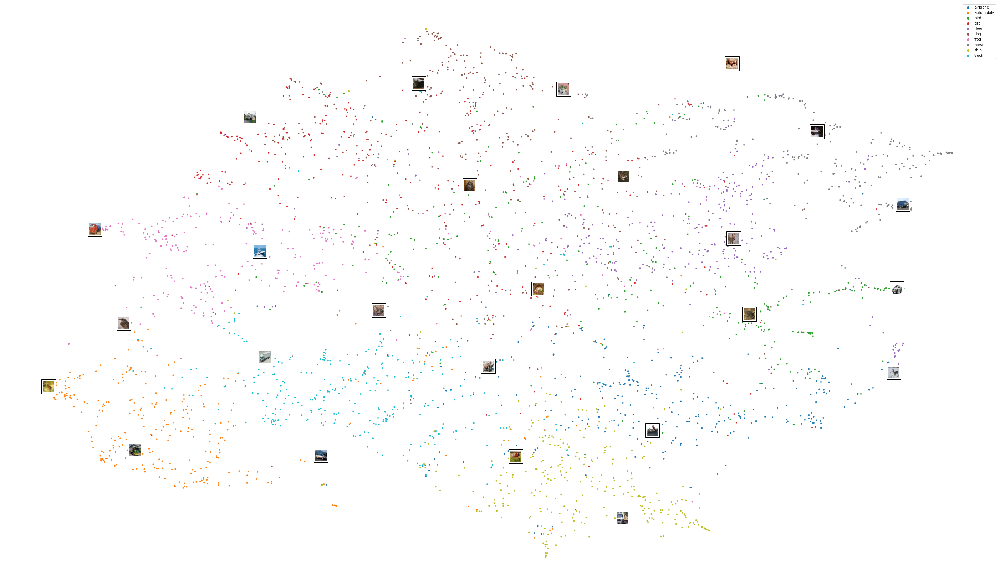

In [219]:
cmap_4 = plt.cm.tab10
plt.figure(figsize=(50,30))
scatter_4 = plt.scatter(tsne_results_4[:,0],tsne_results_4[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_4)
plt.legend(handles=scatter_4.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_4):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

#### Predictions

In [87]:
model_4 = tf.keras.models.load_model('CNN_model_4.h5')
preds_4 = model_4.predict(x_test_norm)
preds_4.shape

313/313 [==============================] - 1s 3ms/step


(10000, 10)

In [88]:
cm_4 = sns.light_palette((260, 75, 60), input="husl", as_cmap=True)

In [89]:
df_4= pd.DataFrame(preds_4[0:20], columns = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'])
df_4.style.format("{:.2%}").background_gradient(cmap=cm_4)

,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
0,0.92%,0.01%,0.88%,96.47%,0.09%,0.41%,1.02%,0.05%,0.13%,0.00%
1,0.19%,1.17%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,98.62%,0.01%
2,0.67%,4.88%,0.03%,0.21%,0.01%,0.02%,0.04%,0.01%,93.29%,0.84%
3,33.99%,0.19%,41.81%,0.14%,0.42%,0.02%,0.33%,0.01%,23.06%,0.04%
4,0.01%,0.02%,1.34%,0.50%,10.40%,0.04%,87.68%,0.00%,0.01%,0.00%
5,0.03%,0.04%,0.31%,19.02%,1.08%,47.92%,30.95%,0.63%,0.01%,0.02%
6,0.30%,1.32%,2.17%,2.95%,0.03%,79.02%,0.35%,1.07%,0.01%,12.78%
7,0.06%,0.01%,2.47%,0.38%,0.13%,0.04%,96.89%,0.01%,0.01%,0.00%
8,0.01%,0.01%,0.09%,96.54%,0.73%,1.54%,0.96%,0.11%,0.00%,0.00%
9,0.04%,89.26%,0.06%,0.02%,0.01%,0.02%,0.33%,0.01%,0.24%,10.01%


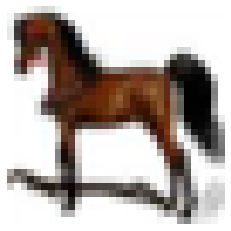

In [90]:
(_,_), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

img_4 = test_images[2004]
img_tensor_4 = image.img_to_array(img_4)
img_tensor_4 = np.expand_dims(img_tensor_4, axis=0)

class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog' 
,'horse'
,'ship'
,'truck']

plt.imshow(img_4, cmap='viridis')
plt.axis('off')
plt.show()

In [91]:
# Extracts the outputs of the top 8 layers:
layer_outputs_4 = [layer.output for layer in model_4.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model_4 = models.Model(inputs=model_4.input, outputs=layer_outputs_4)

In [92]:
activations_4 = activation_model_4.predict(img_tensor_4)
len(activations_4)

1/1 [==============================] - 0s 94ms/step


8

In [93]:
layer_names = []
for layer in model_4.layers:
    layer_names.append(layer.name)
    
layer_names

['conv2d_2',
 'max_pooling2d_2',
 'conv2d_3',
 'max_pooling2d_3',
 'conv2d_4',
 'max_pooling2d_4',
 'flatten_3',
 'dense_7',
 'batch_normalization',
 'dense_8']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


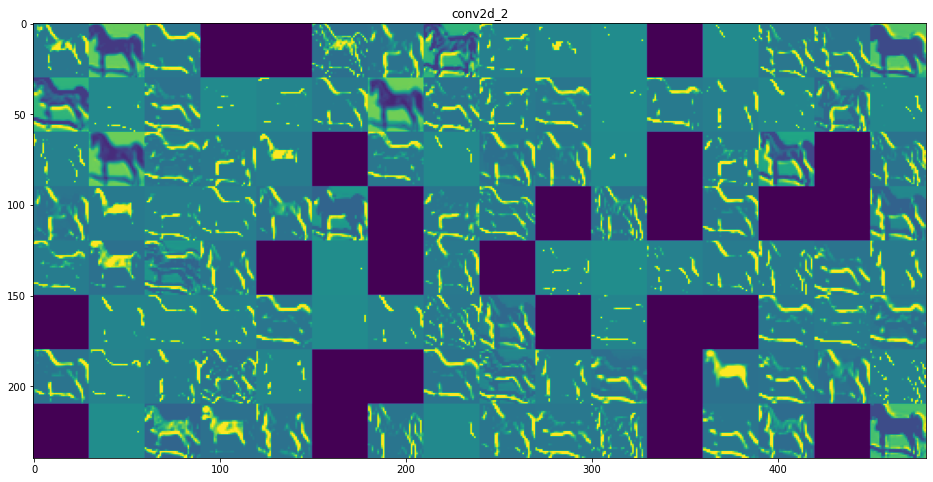

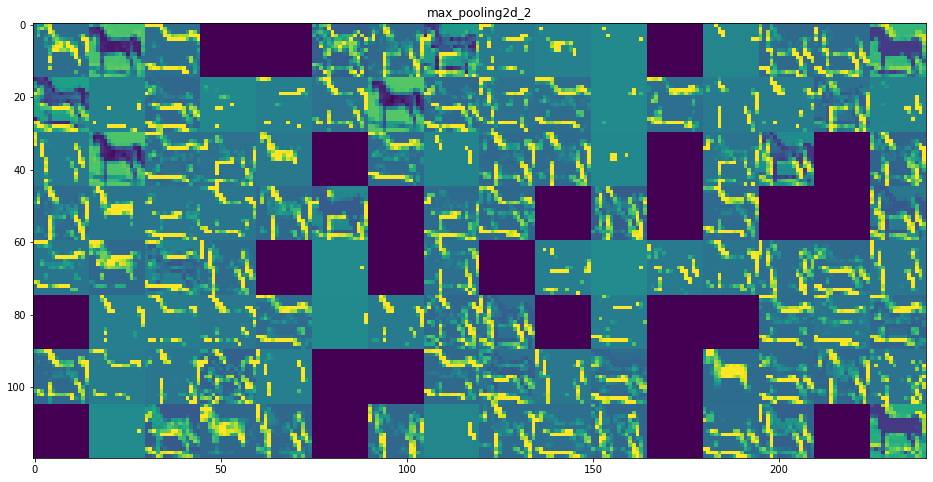

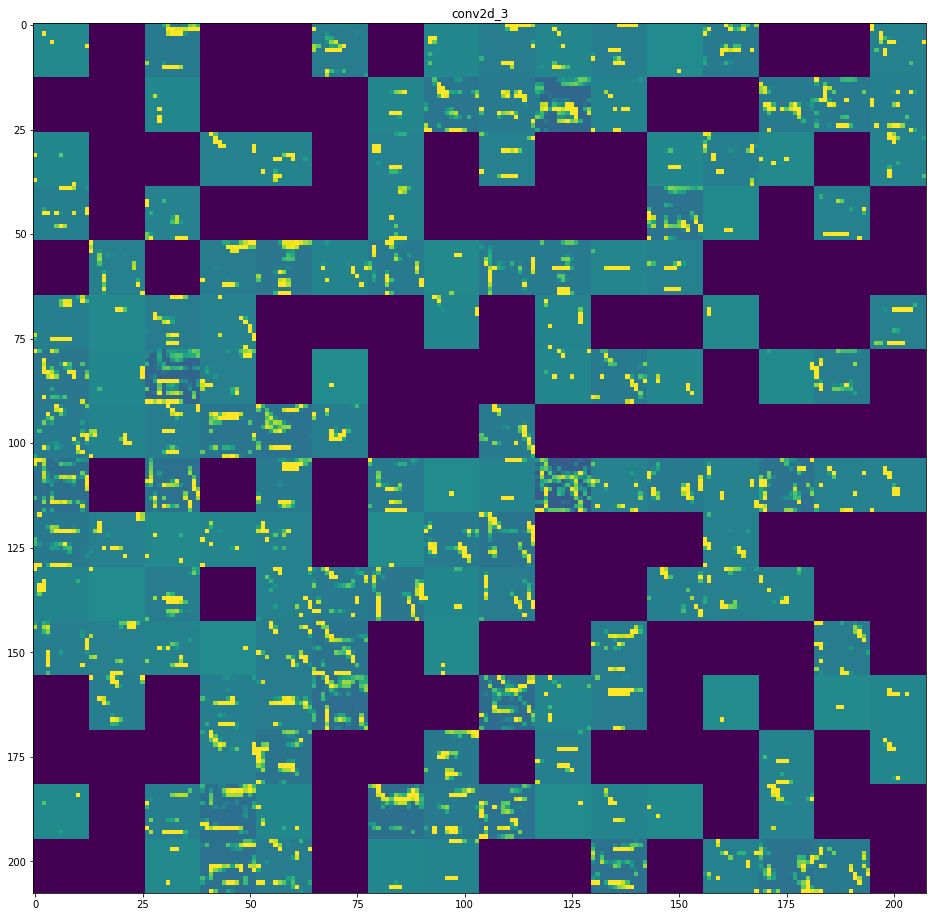

In [94]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model_4.layers[:3]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations_4):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show();

##Experiment 5: Experiments 1-4 with regularization 
https://www.analyticsvidhya.com/blog/2018/04/fundamentals-deep-learning-regularization-techniques/

#### Model 5.1

Same as Model 1 with regularization - Dropout (0.25)

In [95]:
## Build
from keras import regularizers
from keras.layers.core import Dropout

model_5_1 = Sequential()
model_5_1.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_1.add(layers.Dense(units = 100, activation = "relu"))
model_5_1.add(Dropout(0.25))
model_5_1.add(layers.Dense(units = 150, activation = "relu"))
model_5_1.add(Dropout(0.25))
model_5_1.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_5_1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_4 (Flatten)         (None, 3072)              0         
                                                                 
 dense_9 (Dense)             (None, 100)               307300    
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_10 (Dense)            (None, 150)               15150     
                                                                 
 dropout_1 (Dropout)         (None, 150)               0         
                                                                 
 output_layer (Dense)        (None, 10)                1510      
                                                                 
Total params: 323,960
Trainable params: 323,960
Non-tr

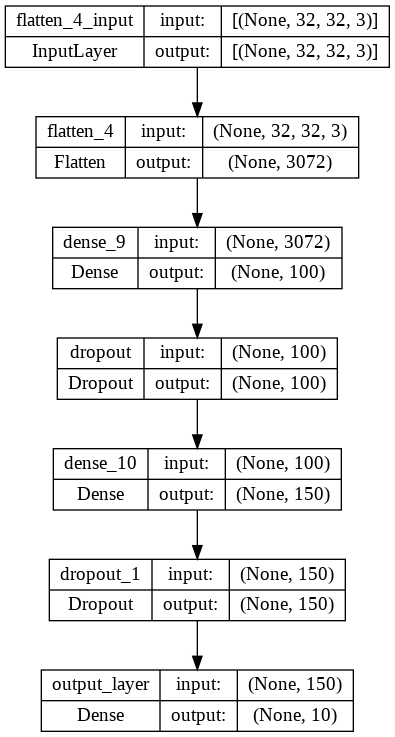

In [96]:
keras.utils.plot_model(model_5_1, "CIFAR_model.png", show_shapes=True) 

In [97]:
## Compile

model_5_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [98]:
## Train 
time = perf_counter()

history_5_1 = model_5_1.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_1.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 3ms/step - loss: 2.0794 - accuracy: 0.2159 - val_loss: 1.9067 - val_accuracy: 0.2904
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9739 - accuracy: 0.2600 - val_loss: 1.9453 - val_accuracy: 0.2798
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9427 - accuracy: 0.2736 - val_loss: 1.8719 - val_accuracy: 0.3102
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9294 - accuracy: 0.2806 - val_loss: 1.8445 - val_accuracy: 0.3354
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9066 - accuracy: 0.2946 - val_loss: 1.8598 - val_accuracy: 0.3326
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.8948 - accuracy: 0.2969 - val_loss: 1.8360 - val_accuracy: 0.3328
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.8911 - accuracy: 0.3007 - val_loss: 1.8496 - val_accuracy: 0.3406

In [99]:
time_5_1 = perf_counter() - time
print(time_5_1)

29.7990868830002


In [100]:
## Evaluate

model_5_1 = tf.keras.models.load_model("DNN_model_5_1.h5")
print(f"Test acc: {model_5_1.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.7860 - accuracy: 0.3650
Test acc: 0.365


#### Model 5.1.1

Same as Model 1 with regularization - Dropout (0.1)

In [101]:
## Build
from keras import regularizers
from keras.layers.core import Dropout

model_5_11 = Sequential()
model_5_11.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_11.add(layers.Dense(units = 100, activation = "relu"))
model_5_11.add(Dropout(0.1))
model_5_11.add(layers.Dense(units = 150, activation = "relu"))
model_5_11.add(Dropout(0.1))
model_5_11.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_5_11.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_5 (Flatten)         (None, 3072)              0         
                                                                 
 dense_11 (Dense)            (None, 100)               307300    
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense_12 (Dense)            (None, 150)               15150     
                                                                 
 dropout_3 (Dropout)         (None, 150)               0         
                                                                 
 output_layer (Dense)        (None, 10)                1510      
                                                                 
Total params: 323,960
Trainable params: 323,960
Non-tr

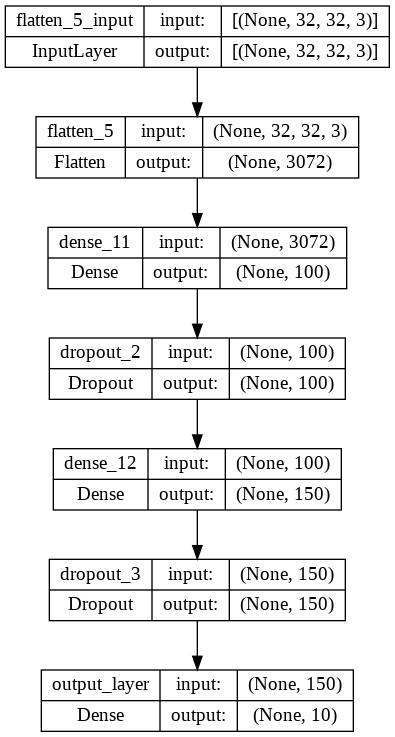

In [102]:
keras.utils.plot_model(model_5_11, "CIFAR_model.png", show_shapes=True) 

In [103]:
## Compile

model_5_11.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [104]:
## Train 
time = perf_counter()

history_5_11 = model_5_11.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_11.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 3ms/step - loss: 1.9567 - accuracy: 0.2753 - val_loss: 1.8126 - val_accuracy: 0.3386
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.8155 - accuracy: 0.3406 - val_loss: 1.7244 - val_accuracy: 0.3778
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.7627 - accuracy: 0.3641 - val_loss: 1.7404 - val_accuracy: 0.3640
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.7171 - accuracy: 0.3832 - val_loss: 1.6762 - val_accuracy: 0.4022
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6870 - accuracy: 0.3920 - val_loss: 1.6752 - val_accuracy: 0.3950
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6766 - accuracy: 0.3950 - val_loss: 1.6413 - val_accuracy: 0.4000
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6541 - accuracy: 0.4054 - val_loss: 1.6294 - val_accuracy: 0.4208

In [105]:
time_5_11 = perf_counter() - time
print(time_5_11)

30.08208708899997


In [106]:
## Evaluate

model_5_11 = tf.keras.models.load_model("DNN_model_5_11.h5")
print(f"Test acc: {model_5_11.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.5539 - accuracy: 0.4455
Test acc: 0.445


#### Model 5.1.2

Same as Model 5.1 with regularization - Dropout (0.1) new hidden nodes (550, 300)

In [107]:
## Build
from keras import regularizers
from keras.layers.core import Dropout

model_5_12 = Sequential()
model_5_12.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_12.add(layers.Dense(units = 550, activation = "relu"))
model_5_12.add(Dropout(0.1))
model_5_12.add(layers.Dense(units = 300, activation = "relu"))
model_5_12.add(Dropout(0.1))
model_5_12.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_5_12.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_6 (Flatten)         (None, 3072)              0         
                                                                 
 dense_13 (Dense)            (None, 550)               1690150   
                                                                 
 dropout_4 (Dropout)         (None, 550)               0         
                                                                 
 dense_14 (Dense)            (None, 300)               165300    
                                                                 
 dropout_5 (Dropout)         (None, 300)               0         
                                                                 
 output_layer (Dense)        (None, 10)                3010      
                                                                 
Total params: 1,858,460
Trainable params: 1,858,460
No

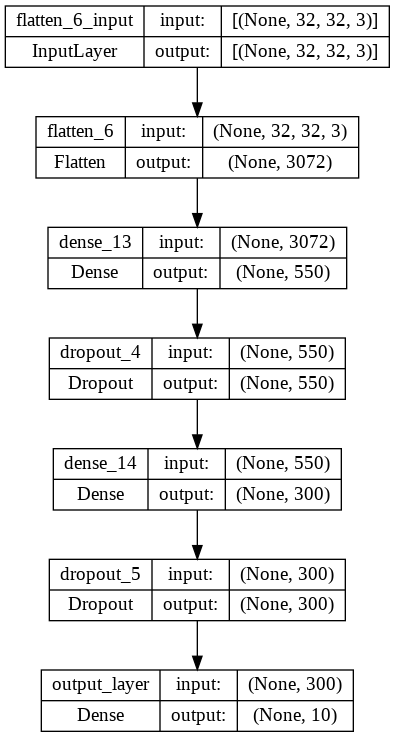

In [108]:
keras.utils.plot_model(model_5_12, "CIFAR_model.png", show_shapes=True) 

In [109]:
## Compile

model_5_12.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [110]:
## Train 
time = perf_counter()

history_5_12 = model_5_12.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_12.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 3ms/step - loss: 1.9251 - accuracy: 0.3028 - val_loss: 1.8034 - val_accuracy: 0.3394
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.7528 - accuracy: 0.3645 - val_loss: 1.6964 - val_accuracy: 0.3866
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6873 - accuracy: 0.3942 - val_loss: 1.6257 - val_accuracy: 0.4190
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6419 - accuracy: 0.4080 - val_loss: 1.5969 - val_accuracy: 0.4284
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6137 - accuracy: 0.4225 - val_loss: 1.5722 - val_accuracy: 0.4298
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5823 - accuracy: 0.4298 - val_loss: 1.5699 - val_accuracy: 0.4314
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5532 - accuracy: 0.4402 - val_loss: 1.5898 - val_accuracy: 0.4298

In [111]:
time_5_12 = perf_counter() - time
print(time_5_12)

34.33190413900002


In [112]:
## Evaluate

model_5_12 = tf.keras.models.load_model("DNN_model_5_12.h5")
print(f"Test acc: {model_5_12.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.4437 - accuracy: 0.4885
Test acc: 0.488


#### Model 5.1.3

Same as Model 5.1.2 with regularization - Dropout (0.10) + added layer (250 nodes) + output activation = sigmoid

In [113]:
## Build
from keras import regularizers
from keras.layers.core import Dropout

model_5_13 = Sequential()
model_5_13.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_13.add(layers.Dense(units = 550, activation = "relu"))
model_5_13.add(Dropout(0.1))
model_5_13.add(layers.Dense(units = 300, activation = "relu"))
model_5_13.add(Dropout(0.1))
model_5_13.add(layers.Dense(units = 250, activation = "relu"))
model_5_13.add(Dropout(0.1))
model_5_13.add(layers.Dense(name = "output_layer", units = 10, activation = "sigmoid"))

model_5_13.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_7 (Flatten)         (None, 3072)              0         
                                                                 
 dense_15 (Dense)            (None, 550)               1690150   
                                                                 
 dropout_6 (Dropout)         (None, 550)               0         
                                                                 
 dense_16 (Dense)            (None, 300)               165300    
                                                                 
 dropout_7 (Dropout)         (None, 300)               0         
                                                                 
 dense_17 (Dense)            (None, 250)               75250     
                                                                 
 dropout_8 (Dropout)         (None, 250)              

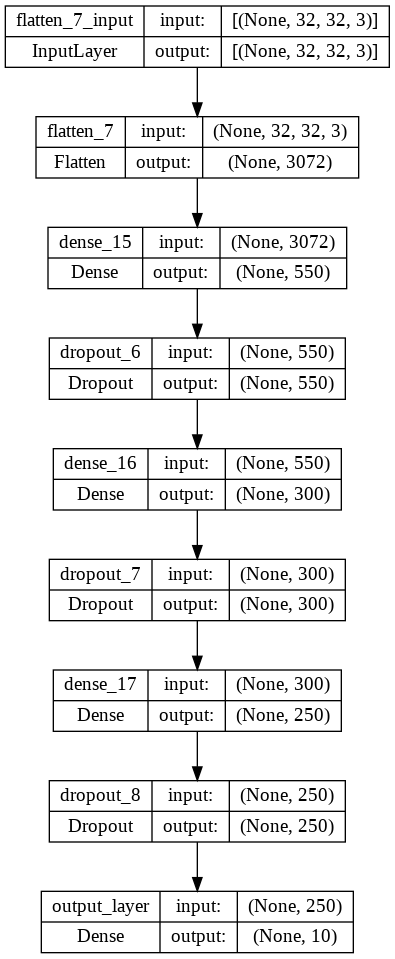

In [114]:
keras.utils.plot_model(model_5_13, "CIFAR_model.png", show_shapes=True) 

In [115]:
## Compile

model_5_13.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [116]:
## Train 
time = perf_counter()

history_5_13 = model_5_13.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_13.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 4ms/step - loss: 1.9365 - accuracy: 0.2899 - val_loss: 1.7668 - val_accuracy: 0.3626
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.7816 - accuracy: 0.3557 - val_loss: 1.6821 - val_accuracy: 0.3918
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.7150 - accuracy: 0.3824 - val_loss: 1.6606 - val_accuracy: 0.4054
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6662 - accuracy: 0.3981 - val_loss: 1.6114 - val_accuracy: 0.4192
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6409 - accuracy: 0.4113 - val_loss: 1.6004 - val_accuracy: 0.4142
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6113 - accuracy: 0.4209 - val_loss: 1.5948 - val_accuracy: 0.4248
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5870 - accuracy: 0.4283 - val_loss: 1.6454 - val_accuracy: 0.4080

In [117]:
time_5_13 = perf_counter() - time
print(time_5_13)

47.41263552300006


In [118]:
## Evaluate

model_5_13 = tf.keras.models.load_model("DNN_model_5_13.h5")
print(f"Test acc: {model_5_13.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.4712 - accuracy: 0.4798
Test acc: 0.480


#### Model 5.2 

Same as Model 2 with regularization

In [119]:
model_5_2 = Sequential()
model_5_2.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_2.add(layers.Dense(units = 100, activation = "relu", kernel_regularizer=regularizers.l2(0.01)))
model_5_2.add(layers.Dense(units = 250, activation = "relu", kernel_regularizer=regularizers.l2(0.01)))
model_5_2.add(layers.Dense(units = 150, activation = "relu", kernel_regularizer=regularizers.l2(0.01)))
model_5_2.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_5_2.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_8 (Flatten)         (None, 3072)              0         
                                                                 
 dense_18 (Dense)            (None, 100)               307300    
                                                                 
 dense_19 (Dense)            (None, 250)               25250     
                                                                 
 dense_20 (Dense)            (None, 150)               37650     
                                                                 
 output_layer (Dense)        (None, 10)                1510      
                                                                 
Total params: 371,710
Trainable params: 371,710
Non-trainable params: 0
_________________________________________________________________


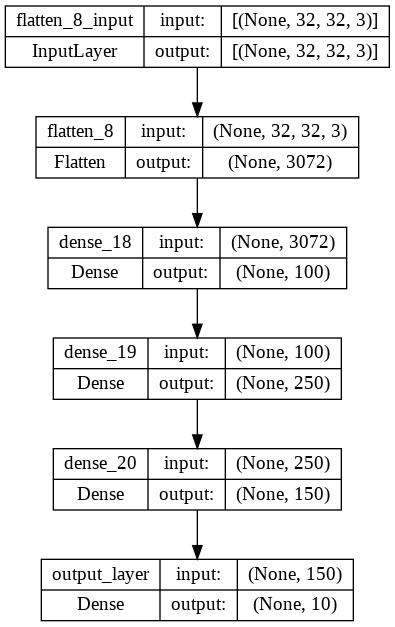

In [120]:
keras.utils.plot_model(model_5_2, "CIFAR_model.png", show_shapes=True) 

In [121]:
## Compile

model_5_2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [122]:
## Train 
time = perf_counter()

history_5_2 = model_5_2.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_2.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 3ms/step - loss: 2.5241 - accuracy: 0.3004 - val_loss: 2.0226 - val_accuracy: 0.3302
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9797 - accuracy: 0.3396 - val_loss: 2.0306 - val_accuracy: 0.2894
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9334 - accuracy: 0.3486 - val_loss: 1.9412 - val_accuracy: 0.3208
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.9182 - accuracy: 0.3508 - val_loss: 1.9600 - val_accuracy: 0.3334
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.8972 - accuracy: 0.3579 - val_loss: 1.9905 - val_accuracy: 0.3058
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.8861 - accuracy: 0.3589 - val_loss: 1.8800 - val_accuracy: 0.3586
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.8742 - accuracy: 0.3652 - val_loss: 1.9064 - val_accuracy: 0.3382

In [123]:
time_5_2 = perf_counter() - time
print(time_5_2)

20.77853333300004


In [124]:
## Evaluate

model_5_2 = tf.keras.models.load_model("DNN_model_5_2.h5")
print(f"Test acc: {model_5_2.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.8515 - accuracy: 0.3753
Test acc: 0.375


#### Model 5.2.1

Same as Model 2 with bais regularization L2

In [125]:
from keras.regularizers import l2

model_5_21 = Sequential()
model_5_21.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_21.add(layers.Dense(units = 100, activation = "relu", bias_regularizer=l2(0.01)))
model_5_21.add(layers.Dense(units = 250, activation = "relu", bias_regularizer=l2(0.01)))
model_5_21.add(layers.Dense(units = 150, activation = "relu", bias_regularizer=l2(0.01)))
model_5_21.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_5_21.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_9 (Flatten)         (None, 3072)              0         
                                                                 
 dense_21 (Dense)            (None, 100)               307300    
                                                                 
 dense_22 (Dense)            (None, 250)               25250     
                                                                 
 dense_23 (Dense)            (None, 150)               37650     
                                                                 
 output_layer (Dense)        (None, 10)                1510      
                                                                 
Total params: 371,710
Trainable params: 371,710
Non-trainable params: 0
_________________________________________________________________


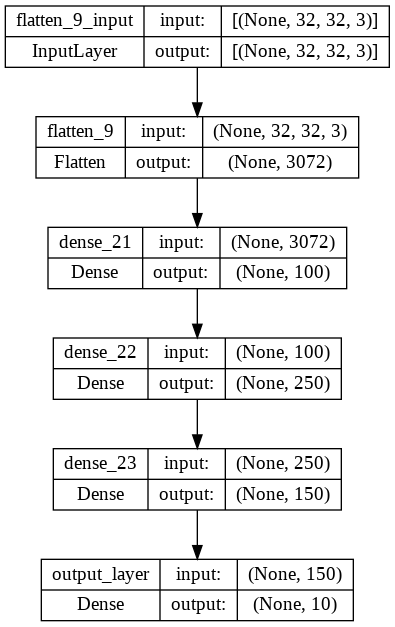

In [126]:
keras.utils.plot_model(model_5_21, "CIFAR_model.png", show_shapes=True) 

In [127]:
## Compile

model_5_21.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [128]:
## Train 
time = perf_counter()

history_5_21 = model_5_21.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_21.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 3ms/step - loss: 1.8655 - accuracy: 0.3214 - val_loss: 1.8131 - val_accuracy: 0.3442
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6934 - accuracy: 0.3921 - val_loss: 1.6732 - val_accuracy: 0.3902
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6126 - accuracy: 0.4211 - val_loss: 1.5704 - val_accuracy: 0.4324
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5541 - accuracy: 0.4421 - val_loss: 1.5783 - val_accuracy: 0.4250
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5220 - accuracy: 0.4584 - val_loss: 1.5778 - val_accuracy: 0.4300
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4902 - accuracy: 0.4675 - val_loss: 1.5327 - val_accuracy: 0.4460
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4663 - accuracy: 0.4737 - val_loss: 1.5149 - val_accuracy: 0.4644

In [129]:
time_5_21 = perf_counter() - time
print(time_5_21)

22.59875957700001


In [130]:
## Evaluate

model_5_21 = tf.keras.models.load_model("DNN_model_5_21.h5")
print(f"Test acc: {model_5_21.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.4656 - accuracy: 0.4791
Test acc: 0.479


#### Model 5.2.2 - Best model, tied with 5.2.3

Same as Model 5.2.1 with bais regularization L2, updated nodes (550, 300, 250)

In [131]:
from keras.regularizers import l2

model_5_22 = Sequential()
model_5_22.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_22.add(layers.Dense(units = 550, activation = "relu", bias_regularizer=l2(0.01)))
model_5_22.add(layers.Dense(units = 300, activation = "relu", bias_regularizer=l2(0.01)))
model_5_22.add(layers.Dense(units = 250, activation = "relu", bias_regularizer=l2(0.01)))
model_5_22.add(layers.Dense(name = "output_layer", units = 10, activation = "softmax"))

model_5_22.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_10 (Flatten)        (None, 3072)              0         
                                                                 
 dense_24 (Dense)            (None, 550)               1690150   
                                                                 
 dense_25 (Dense)            (None, 300)               165300    
                                                                 
 dense_26 (Dense)            (None, 250)               75250     
                                                                 
 output_layer (Dense)        (None, 10)                2510      
                                                                 
Total params: 1,933,210
Trainable params: 1,933,210
Non-trainable params: 0
_________________________________________________________________


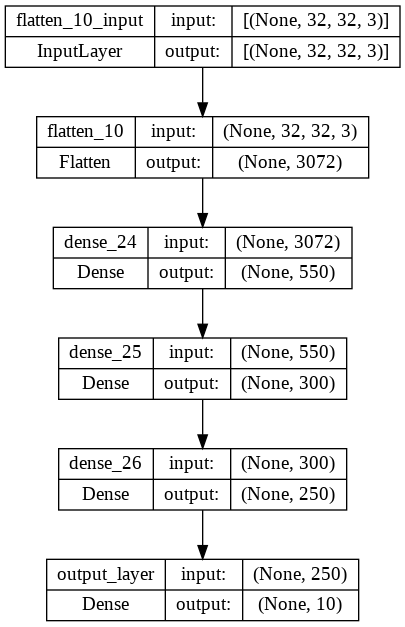

In [132]:
keras.utils.plot_model(model_5_22, "CIFAR_model.png", show_shapes=True) 

In [133]:
## Compile

model_5_22.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [134]:
## Train 
time = perf_counter()

history_5_22 = model_5_22.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_22.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 3s 4ms/step - loss: 1.8854 - accuracy: 0.3184 - val_loss: 1.7367 - val_accuracy: 0.3686
Epoch 2/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6923 - accuracy: 0.3921 - val_loss: 1.6752 - val_accuracy: 0.3858
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6043 - accuracy: 0.4250 - val_loss: 1.5936 - val_accuracy: 0.4262
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5453 - accuracy: 0.4469 - val_loss: 1.5954 - val_accuracy: 0.4306
Epoch 5/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4990 - accuracy: 0.4651 - val_loss: 1.5926 - val_accuracy: 0.4244
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4656 - accuracy: 0.4771 - val_loss: 1.5149 - val_accuracy: 0.4570
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4314 - accuracy: 0.4900 - val_loss: 1.5206 - val_accuracy: 0.4514

In [135]:
time_5_22 = perf_counter() - time
print(time_5_22)

36.3979104980001


In [136]:
## Evaluate

model_5_22 = tf.keras.models.load_model("DNN_model_5_22.h5")
print(f"Test acc: {model_5_22.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 3ms/step - loss: 1.4365 - accuracy: 0.4908
Test acc: 0.491


##### Plot Metrics

In [213]:
history_dict_5_22 = history_4.history
history_dict_5_22.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [214]:
history_df_5_22=pd.DataFrame(history_dict_5_22)
history_df_5_22.tail().round(3)

,loss,accuracy,val_loss,val_accuracy
5,0.583,0.825,0.974,0.704
6,0.505,0.852,0.856,0.755
7,0.439,0.877,1.049,0.714
8,0.388,0.895,1.039,0.745
9,0.340,0.913,1.038,0.743


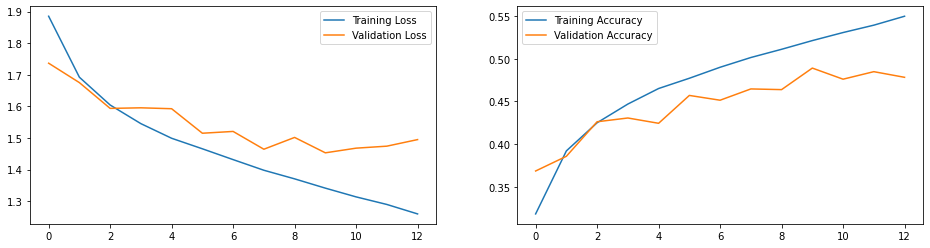

In [215]:
## Loss and acuracy
plot_history(history_5_22)

In [216]:
## Confusion matrix
pred_5_22= model_5_22.predict(x_test_norm)
pred_5_22=np.argmax(pred_5_22, axis=1)

313/313 [==============================] - 1s 1ms/step


313/313 [==============================] - 1s 3ms/step


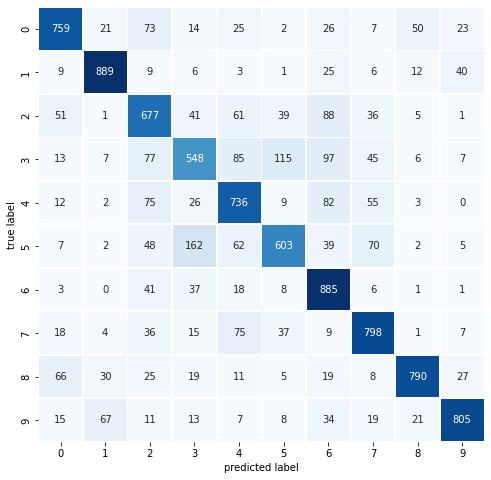

In [141]:
# Get the predicted classes:
pred_classes_5_22 = np.argmax(model_5_22.predict(x_test_norm), axis=-1)
pred_classes_5_22;

conf_mx_5_22 = tf.math.confusion_matrix(y_test, pred_classes_5_22)
conf_mx_5_22;

plot_confusion_matrix(y_test,pred_classes_5_22)

##### Activation and Performance

In [217]:
# Extracts the outputs of all layers:
layer_outputs_5_22 = [layer.output for layer in model_5_22.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_5_22 = models.Model(inputs=model_5_22.input, outputs=layer_outputs_5_22)

# Get activation values for the last dense layer
activations_5_22 = activation_model_5_22.predict(x_valid_norm[:3250])
dense_layer_activations_5_22 = activations_5_22[-3]
output_layer_activations_5_22 = activations_5_22[-1]

102/102 [==============================] - 0s 1ms/step


In [220]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_5_22 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_5_22 = tsne_5_22.fit_transform(dense_layer_activations_4)

# Scaling
tsne_results_5_22 = (tsne_results_5_22 - tsne_results_5_22.min()) / (tsne_results_5_22.max() - tsne_results_5_22.min())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3250 samples in 0.002s...
[t-SNE] Computed neighbors for 3250 samples in 0.359s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3250
[t-SNE] Computed conditional probabilities for sample 2000 / 3250
[t-SNE] Computed conditional probabilities for sample 3000 / 3250
[t-SNE] Computed conditional probabilities for sample 3250 / 3250
[t-SNE] Mean sigma: 0.060612
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.822357
[t-SNE] KL divergence after 300 iterations: 1.754069


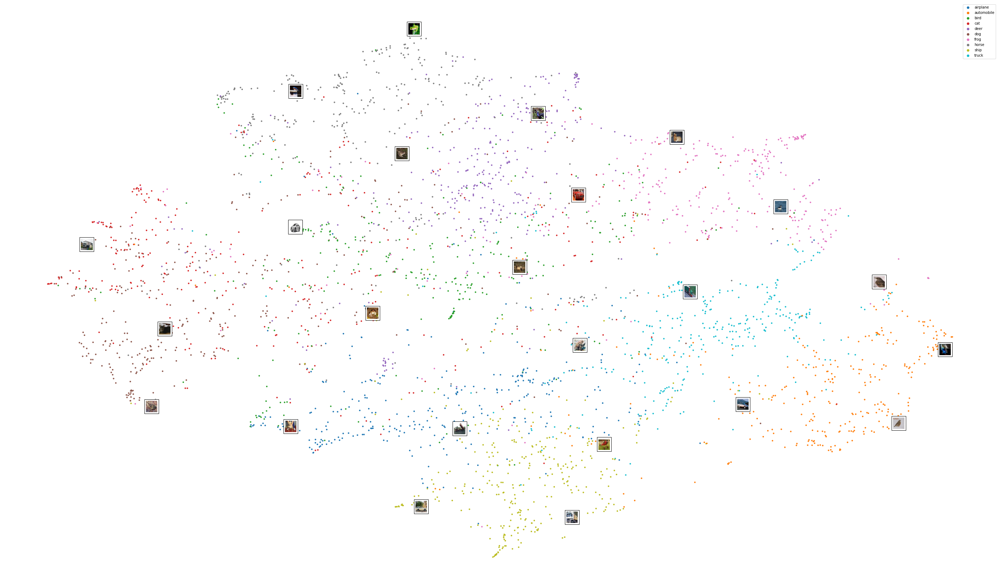

In [221]:
cmap_5_22 = plt.cm.tab10
plt.figure(figsize=(50,30))
scatter_5_22 = plt.scatter(tsne_results_5_22[:,0],tsne_results_5_22[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_5_22)
plt.legend(handles=scatter_5_22.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_5_22):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

##### Predictions

In [145]:
model_5_22 = tf.keras.models.load_model('CNN_model_5_22.h5')
preds_5_22 = model_5_22predict(x_test_norm)
preds_5_22.shape

313/313 [==============================] - 1s 3ms/step


(10000, 10)

In [146]:
cm_5_22 = sns.light_palette((260, 75, 60), input="husl", as_cmap=True)

In [222]:
df_5_22= pd.DataFrame(preds_5_22[0:20], columns = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'])
df_5_22.style.format("{:.2%}").background_gradient(cmap=cm_5_22)

NameError: ignored

In [ ]:
(_,_), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

img_5_22 = test_images[2004]
img_tensor_5_22 = image.img_to_array(img_5_22)
img_tensor_5_22 = np.expand_dims(img_tensor_5_22, axis=0)

class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog' 
,'horse'
,'ship'
,'truck']

plt.imshow(img_5_22, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs_5_22 = [layer.output for layer in model_5_22.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model_5_22 = models.Model(inputs=model_5_22.input, outputs=layer_outputs_5_22)

In [ ]:
activations_5_22 = activation_model_5_22.predict(img_tensor_5_22)
len(activations_5_22)

In [ ]:
layer_names = []
for layer in model_5_22.layers:
    layer_names.append(layer.name)
    
layer_names

In [ ]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model_5_22.layers[:3]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations_5_22):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show();

#### Model 5.2.3 - Best model, tied with 5.2.2

Same as Model 5.2.2 with dropout - 0.1 + output activation = sigmoid

In [153]:
from keras.regularizers import l2

model_5_23 = Sequential()
model_5_23.add(keras.layers.Flatten(input_shape = [32, 32, 3]))
model_5_23.add(layers.Dense(units = 550, activation = "relu", bias_regularizer=l2(0.01)))
model_5_13.add(Dropout(0.1))
model_5_23.add(layers.Dense(units = 300, activation = "relu", bias_regularizer=l2(0.01)))
model_5_13.add(Dropout(0.1))
model_5_23.add(layers.Dense(units = 250, activation = "relu", bias_regularizer=l2(0.01)))
model_5_13.add(Dropout(0.1))
model_5_23.add(layers.Dense(name = "output_layer", units = 10, activation = "sigmoid"))

model_5_23.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_11 (Flatten)        (None, 3072)              0         
                                                                 
 dense_27 (Dense)            (None, 550)               1690150   
                                                                 
 dense_28 (Dense)            (None, 300)               165300    
                                                                 
 dense_29 (Dense)            (None, 250)               75250     
                                                                 
 output_layer (Dense)        (None, 10)                2510      
                                                                 
Total params: 1,933,210
Trainable params: 1,933,210
Non-trainable params: 0
_________________________________________________________________


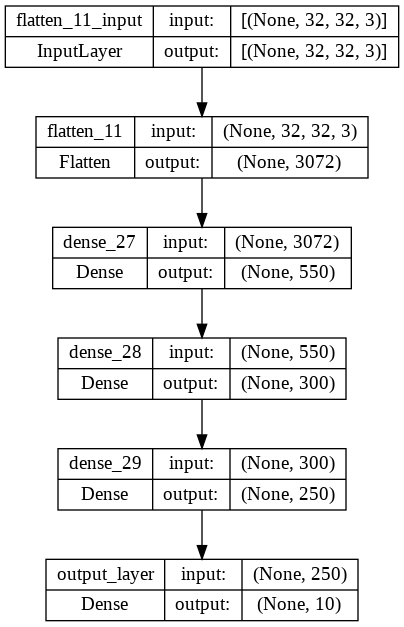

In [154]:
keras.utils.plot_model(model_5_23, "CIFAR_model.png", show_shapes=True) 

In [155]:
## Compile

model_5_23.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [156]:
## Train 
time = perf_counter()

history_5_23 = model_5_23.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_model_5_23.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 4s 5ms/step - loss: 1.8833 - accuracy: 0.3190 - val_loss: 1.7625 - val_accuracy: 0.3566
Epoch 2/200
704/704 [==============================] - 3s 4ms/step - loss: 1.6925 - accuracy: 0.3933 - val_loss: 1.7000 - val_accuracy: 0.3896
Epoch 3/200
704/704 [==============================] - 2s 3ms/step - loss: 1.6024 - accuracy: 0.4280 - val_loss: 1.6163 - val_accuracy: 0.4110
Epoch 4/200
704/704 [==============================] - 2s 3ms/step - loss: 1.5431 - accuracy: 0.4455 - val_loss: 1.5790 - val_accuracy: 0.4296
Epoch 5/200
704/704 [==============================] - 3s 4ms/step - loss: 1.4971 - accuracy: 0.4642 - val_loss: 1.5722 - val_accuracy: 0.4288
Epoch 6/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4582 - accuracy: 0.4804 - val_loss: 1.5259 - val_accuracy: 0.4504
Epoch 7/200
704/704 [==============================] - 2s 3ms/step - loss: 1.4255 - accuracy: 0.4890 - val_loss: 1.5862 - val_accuracy: 0.4312

In [157]:
time_5_23 = perf_counter() - time
print(time_5_23)

35.05012031699994


In [158]:
## Evaluate

model_5_23 = tf.keras.models.load_model("DNN_model_5_23.h5")
print(f"Test acc: {model_5_23.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 2ms/step - loss: 1.4264 - accuracy: 0.4964
Test acc: 0.496


##### Plot Metrics

In [ ]:
history_dict_5_23 = history_4.history
history_dict_5_23.keys()

In [ ]:
history_df_5_23=pd.DataFrame(history_dict_5_23)
history_df_5_23.tail().round(3)

In [ ]:
## Loss and acuracy
plot_history(history_5_23)

In [ ]:
## Confusion matrix
pred_5_23= model_5_23.predict(x_test_norm)
pred_5_23=np.argmax(pred_5_23, axis=1)

In [ ]:
# Get the predicted classes:
pred_classes_5_23 = np.argmax(model_5_23.predict(x_test_norm), axis=-1)
pred_classes_5_23;

conf_mx_5_23 = tf.math.confusion_matrix(y_test, pred_classes_5_23)
conf_mx_5_23;

plot_confusion_matrix(y_test,pred_classes_5_23)

##### Activation and Performance

In [ ]:
# Extracts the outputs of all layers:
layer_outputs_5_23 = [layer.output for layer in model_5_23.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_5_23 = models.Model(inputs=model_5_23.input, outputs=layer_outputs_5_23)

# Get activation values for the last dense layer
activations_5_23 = activation_model_5_23.predict(x_valid_norm[:3250])
dense_layer_activations_5_23 = activations_5_23[-3]
output_layer_activations_5_23 = activations_5_23[-1]

In [ ]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_5_23 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_5_23 = tsne_5_23.fit_transform(dense_layer_activations_4)

# Scaling
tsne_results_5_23 = (tsne_results_5_23 - tsne_results_5_23.min()) / (tsne_results_5_23.max() - tsne_results_5_23.min())

In [ ]:
cmap_5_23 = plt.cm.tab10
plt.figure(figsize=(50,30))
scatter_5_23 = plt.scatter(tsne_results_5_23[:,0],tsne_results_5_23[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_5_23)
plt.legend(handles=scatter_5_23.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_5_23):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

##### Predictions

In [ ]:
model_5_23 = tf.keras.models.load_model('CNN_model_5_23.h5')
preds_5_23 = model_5_23predict(x_test_norm)
preds_5_23.shape

In [ ]:
cm_5_23 = sns.light_palette((260, 75, 60), input="husl", as_cmap=True)

In [ ]:
df_5_23= pd.DataFrame(preds_5_23[0:20], columns = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'])
df_5_23.style.format("{:.2%}").background_gradient(cmap=cm_5_23

In [ ]:
(_,_), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

img_5_23 = test_images[2004]
img_tensor_5_23 = image.img_to_array(img_5_23)
img_tensor_5_23 = np.expand_dims(img_tensor_5_23, axis=0)

class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog' 
,'horse'
,'ship'
,'truck']

plt.imshow(img_5_23, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs_5_23 = [layer.output for layer in model_5_23.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model_5_23 = models.Model(inputs=model_5_23.input, outputs=layer_outputs_5_23)

In [ ]:
activations_5_23 = activation_model_5_22.predict(img_tensor_5_23)
len(activations_5_23)

In [ ]:
layer_names = []
for layer in model_5_23.layers:
    layer_names.append(layer.name)
    
layer_names

In [ ]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model_5_23.layers[:3]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations_5_23):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show();

#### Model 5.3

Same as model 3 with regulaization

In [159]:
## Build CNN

model_5_3 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), # Layer 1 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.3), # Layer 1 end
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), # Layer 2 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.3), # Layer 2 end
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification 
  Dense(units=10, activation=tf.nn.softmax)       
])

model_5_3.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 15, 15, 128)      0         
 2D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 6, 6, 256)        0         
 2D)                                                             
                                                                 
 dropout_13 (Dropout)        (None, 6, 6, 256)       

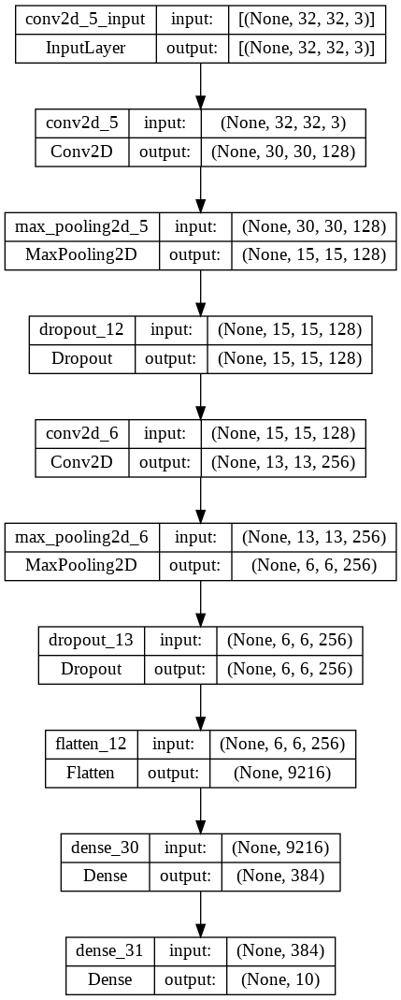

In [160]:
keras.utils.plot_model(model_5_3, "CIFAR10.png", show_shapes=True) 

In [161]:
## Compile

model_5_3.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [162]:
## Train 
time = perf_counter()

history_5_3 = model_5_3.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_3.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 8s 11ms/step - loss: 2.1678 - accuracy: 0.1705 - val_loss: 2.0507 - val_accuracy: 0.1770
Epoch 2/200
704/704 [==============================] - 7s 10ms/step - loss: 2.0076 - accuracy: 0.1875 - val_loss: 1.9842 - val_accuracy: 0.1914
Epoch 3/200
704/704 [==============================] - 7s 11ms/step - loss: 1.9508 - accuracy: 0.1903 - val_loss: 1.9128 - val_accuracy: 0.2026
Epoch 4/200
704/704 [==============================] - 8s 12ms/step - loss: 1.8852 - accuracy: 0.2406 - val_loss: 1.8371 - val_accuracy: 0.2762
Epoch 5/200
704/704 [==============================] - 8s 11ms/step - loss: 1.8062 - accuracy: 0.2998 - val_loss: 1.7937 - val_accuracy: 0.3084
Epoch 6/200
704/704 [==============================] - 7s 11ms/step - loss: 1.7030 - accuracy: 0.3496 - val_loss: 1.7450 - val_accuracy: 0.3072
Epoch 7/200
704/704 [==============================] - 7s 10ms/step - loss: 1.6134 - accuracy: 0.3802 - val_loss: 1.6151 - val_accuracy:

In [163]:
time_5_3 = perf_counter() - time
print(time_5_3)

421.2004742009999


In [164]:
## Evaluate

model_5_3 = tf.keras.models.load_model("CNN_model_5_3.h5")
print(f"Test acc: {model_5_3.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 4ms/step - loss: 0.9503 - accuracy: 0.7249
Test acc: 0.725


#### Model 5.3.1

Same as model 5.3 + updated dropout (0.10)

In [165]:
## Build CNN

model_5_31 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), # Layer 1 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.1), # Layer 1 end
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), # Layer 2 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.1), # Layer 2 end
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification 
  Dense(units=10, activation=tf.nn.softmax)       
])

model_5_31.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 15, 15, 128)      0         
 2D)                                                             
                                                                 
 dropout_14 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 6, 6, 256)        0         
 2D)                                                             
                                                                 
 dropout_15 (Dropout)        (None, 6, 6, 256)       

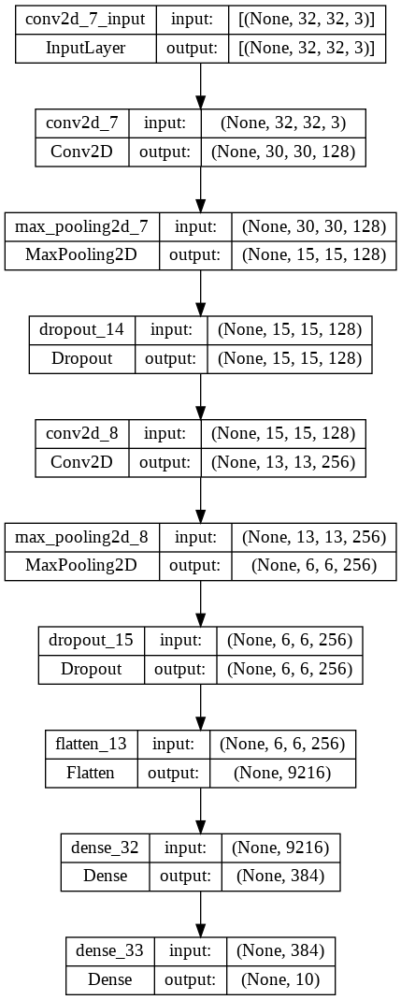

In [166]:
keras.utils.plot_model(model_5_31, "CIFAR10.png", show_shapes=True) 

In [167]:
## Compile

model_5_31.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [168]:
## Train 
time = perf_counter()

history_5_31 = model_5_31.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_31.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 8s 11ms/step - loss: 2.1384 - accuracy: 0.2306 - val_loss: 1.9755 - val_accuracy: 0.2846
Epoch 2/200
704/704 [==============================] - 7s 10ms/step - loss: 1.9132 - accuracy: 0.2908 - val_loss: 1.8728 - val_accuracy: 0.2858
Epoch 3/200
704/704 [==============================] - 7s 10ms/step - loss: 1.7884 - accuracy: 0.3349 - val_loss: 1.7278 - val_accuracy: 0.3692
Epoch 4/200
704/704 [==============================] - 7s 10ms/step - loss: 1.6472 - accuracy: 0.4029 - val_loss: 1.5900 - val_accuracy: 0.4070
Epoch 5/200
704/704 [==============================] - 7s 10ms/step - loss: 1.5453 - accuracy: 0.4383 - val_loss: 1.5012 - val_accuracy: 0.4374
Epoch 6/200
704/704 [==============================] - 7s 10ms/step - loss: 1.4540 - accuracy: 0.4644 - val_loss: 1.4528 - val_accuracy: 0.4520
Epoch 7/200
704/704 [==============================] - 7s 10ms/step - loss: 1.3959 - accuracy: 0.4817 - val_loss: 1.3926 - val_accuracy:

In [169]:
time_5_31 = perf_counter() - time
print(time_5_31)

263.07146005000004


In [170]:
## Evaluate

model_5_31 = tf.keras.models.load_model("CNN_model_5_31.h5")
print(f"Test acc: {model_5_31.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 3ms/step - loss: 1.0485 - accuracy: 0.6858
Test acc: 0.686


#### Model 5.3.2

Same as model 5.3.1 + updated nodes (250, 550, 250)

In [171]:
## Build CNN

model_5_32 = Sequential([
  Conv2D(filters=250, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), # Layer 1 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.1), # Layer 1 end
  Conv2D(filters=550, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), # Layer 2 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.1), # Layer 2 end
  Flatten(),
  Dense(units=250,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification 
  Dense(units=10, activation=tf.nn.softmax)       
])

model_5_32.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 30, 30, 250)       7000      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 15, 15, 250)      0         
 2D)                                                             
                                                                 
 dropout_16 (Dropout)        (None, 15, 15, 250)       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 13, 13, 550)       1238050   
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 6, 6, 550)        0         
 g2D)                                                            
                                                                 
 dropout_17 (Dropout)        (None, 6, 6, 550)       

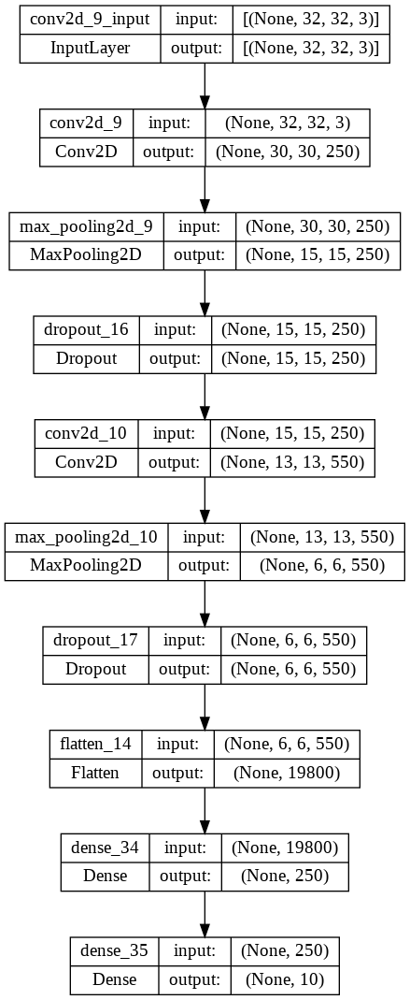

In [172]:
keras.utils.plot_model(model_5_32, "CIFAR10.png", show_shapes=True) 

In [173]:
## Compile

model_5_32.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [174]:
## Train 
time = perf_counter()

history_5_32 = model_5_32.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_32.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 17s 22ms/step - loss: 2.1828 - accuracy: 0.1835 - val_loss: 2.0487 - val_accuracy: 0.2118
Epoch 2/200
704/704 [==============================] - 16s 23ms/step - loss: 1.9926 - accuracy: 0.2390 - val_loss: 1.9665 - val_accuracy: 0.2536
Epoch 3/200
704/704 [==============================] - 16s 23ms/step - loss: 1.8537 - accuracy: 0.3082 - val_loss: 1.8109 - val_accuracy: 0.3214
Epoch 4/200
704/704 [==============================] - 16s 23ms/step - loss: 1.7239 - accuracy: 0.3644 - val_loss: 1.6567 - val_accuracy: 0.3862
Epoch 5/200
704/704 [==============================] - 16s 23ms/step - loss: 1.5973 - accuracy: 0.4097 - val_loss: 1.6481 - val_accuracy: 0.3900
Epoch 6/200
704/704 [==============================] - 15s 22ms/step - loss: 1.4945 - accuracy: 0.4398 - val_loss: 1.4818 - val_accuracy: 0.4288
Epoch 7/200
704/704 [==============================] - 16s 23ms/step - loss: 1.4209 - accuracy: 0.4570 - val_loss: 1.3954 - val_ac

In [175]:
time_5_32 = perf_counter() - time
print(time_5_32)

563.670957413


In [176]:
## Evaluate

model_5_32 = tf.keras.models.load_model("CNN_model_5_32.h5")
print(f"Test acc: {model_5_32.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 2s 5ms/step - loss: 1.0537 - accuracy: 0.6715
Test acc: 0.672


#### Model 5.3.3 - Best Model of 3

Same as model 5.3.1 + closeout activation = sigmoid

In [177]:
## Build CNN

model_5_33 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), # Layer 1 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.1), # Layer 1 end
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), # Layer 2 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.1), # Layer 2 end
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification 
  Dense(units=10, activation=tf.nn.sigmoid)       
])

model_5_33.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 15, 15, 128)      0         
 g2D)                                                            
                                                                 
 dropout_18 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 6, 6, 256)        0         
 g2D)                                                            
                                                                 
 dropout_19 (Dropout)        (None, 6, 6, 256)       

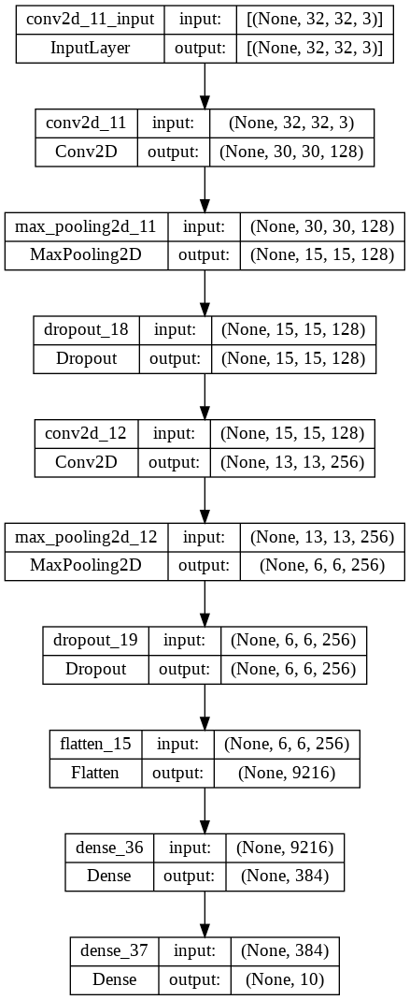

In [178]:
keras.utils.plot_model(model_5_33, "CIFAR10.png", show_shapes=True) 

In [179]:
## Compile

model_5_33.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [180]:
## Train 
time = perf_counter()

history_5_33 = model_5_33.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_33.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 8s 11ms/step - loss: 2.2322 - accuracy: 0.1842 - val_loss: 2.1276 - val_accuracy: 0.1936
Epoch 2/200
704/704 [==============================] - 7s 10ms/step - loss: 2.0691 - accuracy: 0.1946 - val_loss: 2.0034 - val_accuracy: 0.2108
Epoch 3/200
704/704 [==============================] - 7s 10ms/step - loss: 1.9779 - accuracy: 0.2048 - val_loss: 1.9922 - val_accuracy: 0.2228
Epoch 4/200
704/704 [==============================] - 7s 10ms/step - loss: 1.9057 - accuracy: 0.2429 - val_loss: 1.8738 - val_accuracy: 0.2508
Epoch 5/200
704/704 [==============================] - 7s 10ms/step - loss: 1.8127 - accuracy: 0.3036 - val_loss: 1.7675 - val_accuracy: 0.3226
Epoch 6/200
704/704 [==============================] - 7s 10ms/step - loss: 1.7313 - accuracy: 0.3401 - val_loss: 1.7021 - val_accuracy: 0.3356
Epoch 7/200
704/704 [==============================] - 7s 10ms/step - loss: 1.6606 - accuracy: 0.3613 - val_loss: 1.6542 - val_accuracy:

In [181]:
time_5_33 = perf_counter() - time
print(time_5_33)

361.8476680230001


In [182]:
## Evaluate

model_5_33 = tf.keras.models.load_model("CNN_model_5_33.h5")
print(f"Test acc: {model_5_33.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 3ms/step - loss: 0.9909 - accuracy: 0.6914
Test acc: 0.691


##### Plot Metrics

In [223]:
history_dict_5_33 = history_4.history
history_dict_5_33.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [224]:
history_df_5_33=pd.DataFrame(history_dict_5_33)
history_df_5_33.tail().round(3)

,loss,accuracy,val_loss,val_accuracy
5,0.583,0.825,0.974,0.704
6,0.505,0.852,0.856,0.755
7,0.439,0.877,1.049,0.714
8,0.388,0.895,1.039,0.745
9,0.340,0.913,1.038,0.743


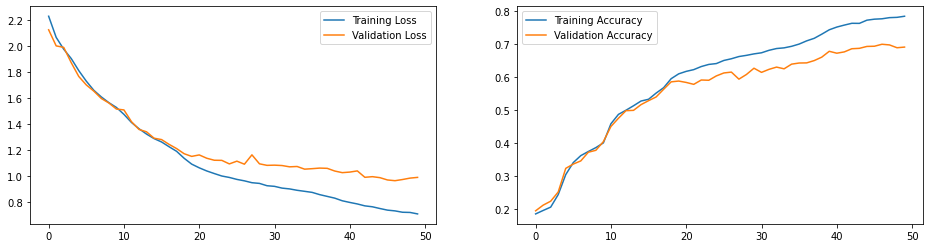

In [225]:
## Loss and acuracy
plot_history(history_5_33)

In [226]:
## Confusion matrix
pred_5_33= model_5_33.predict(x_test_norm)
pred_5_33=np.argmax(pred_5_33, axis=1)

313/313 [==============================] - 1s 2ms/step


313/313 [==============================] - 1s 2ms/step


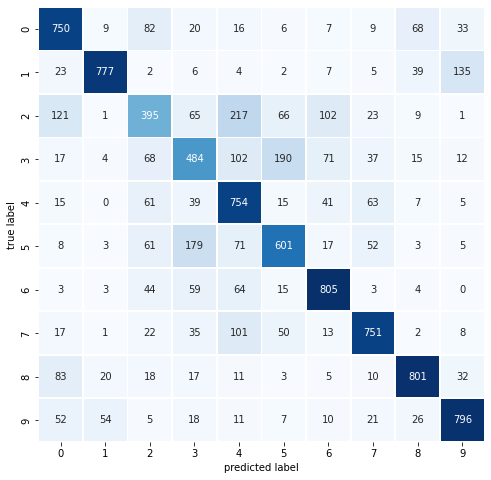

In [228]:
# Get the predicted classes:
pred_classes_5_33 = np.argmax(model_5_33.predict(x_test_norm), axis=-1)
pred_classes_5_33;

conf_mx_5_33 = tf.math.confusion_matrix(y_test, pred_classes_5_33)
conf_mx_5_33;

plot_confusion_matrix(y_test,pred_classes_5_33)

##### Activation and Performance

In [ ]:
# Extracts the outputs of all layers:
layer_outputs_5_23 = [layer.output for layer in model_5_23.layers]

# Creates a model that will return these outputs, given the model input:
activation_model_5_23 = models.Model(inputs=model_5_23.input, outputs=layer_outputs_5_23)

# Get activation values for the last dense layer
activations_5_23 = activation_model_5_23.predict(x_valid_norm[:3250])
dense_layer_activations_5_23 = activations_5_23[-3]
output_layer_activations_5_23 = activations_5_23[-1]

102/102 [==============================] - 0s 2ms/step


In [ ]:
## TSNE
# Reduce the dimension using T-SNE to visualize i n a scatterplot
tsne_5_23 = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results_5_23 = tsne_5_23.fit_transform(dense_layer_activations_4)

# Scaling
tsne_results_5_23 = (tsne_results_5_23 - tsne_results_5_23.min()) / (tsne_results_5_23.max() - tsne_results_5_23.min())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3250 samples in 0.002s...
[t-SNE] Computed neighbors for 3250 samples in 0.571s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3250
[t-SNE] Computed conditional probabilities for sample 2000 / 3250
[t-SNE] Computed conditional probabilities for sample 3000 / 3250
[t-SNE] Computed conditional probabilities for sample 3250 / 3250
[t-SNE] Mean sigma: 0.060612
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.831322
[t-SNE] KL divergence after 300 iterations: 1.752774


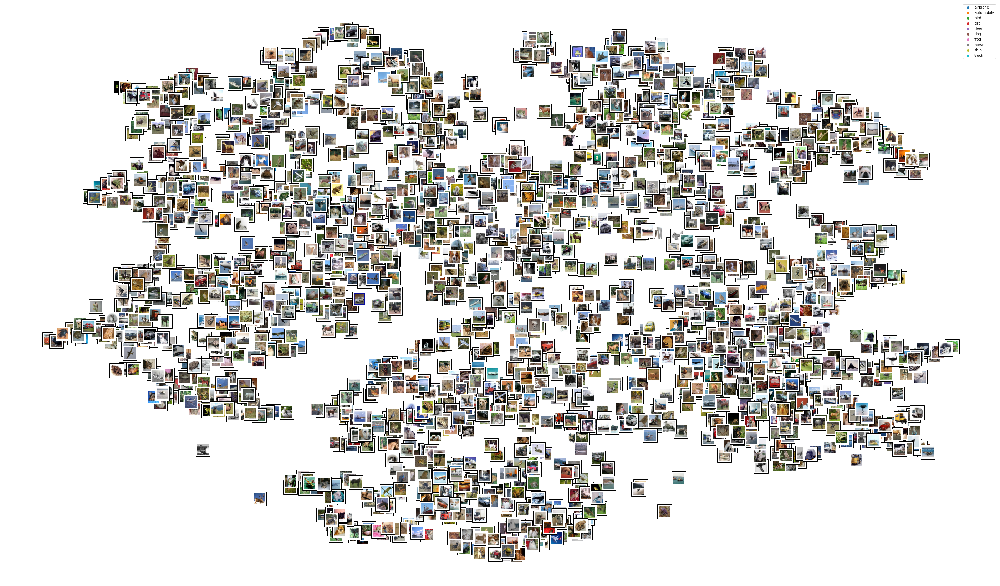

In [ ]:
cmap_5_23 = plt.cm.tab10
plt.figure(figsize=(50,30))
scatter_5_23 = plt.scatter(tsne_results_5_23[:,0],tsne_results_5_23[:,1], c=y_valid_split[:3250], s=10, cmap=cmap_5_23)
plt.legend(handles=scatter_5_23.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results_5_23):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_train[index], cmap="binary"),
            position, bboxprops={"lw": 1})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

##### Predictions

In [ ]:
model_5_23 = tf.keras.models.load_model('CNN_model_5_23.h5')
preds_5_23 = model_5_23predict(x_test_norm)
preds_5_23.shape

313/313 [==============================] - 1s 3ms/step


(10000, 10)

In [ ]:
cm_5_23 = sns.light_palette((260, 75, 60), input="husl", as_cmap=True)

In [ ]:
df_5_23= pd.DataFrame(preds_5_23[0:20], columns = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'])
df_5_23.style.format("{:.2%}").background_gradient(cmap=cm_5_23

,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
0,0.92%,0.01%,0.88%,96.47%,0.09%,0.41%,1.02%,0.05%,0.13%,0.00%
1,0.19%,1.17%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,98.62%,0.01%
2,0.67%,4.88%,0.03%,0.21%,0.01%,0.02%,0.04%,0.01%,93.29%,0.84%
3,33.99%,0.19%,41.81%,0.14%,0.42%,0.02%,0.33%,0.01%,23.06%,0.04%
4,0.01%,0.02%,1.34%,0.50%,10.40%,0.04%,87.68%,0.00%,0.01%,0.00%
5,0.03%,0.04%,0.31%,19.02%,1.08%,47.92%,30.95%,0.63%,0.01%,0.02%
6,0.30%,1.32%,2.17%,2.95%,0.03%,79.02%,0.35%,1.07%,0.01%,12.78%
7,0.06%,0.01%,2.47%,0.38%,0.13%,0.04%,96.89%,0.01%,0.01%,0.00%
8,0.01%,0.01%,0.09%,96.54%,0.73%,1.54%,0.96%,0.11%,0.00%,0.00%
9,0.04%,89.26%,0.06%,0.02%,0.01%,0.02%,0.33%,0.01%,0.24%,10.01%


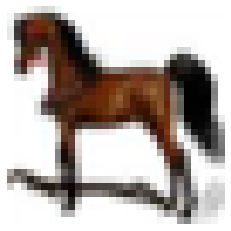

In [ ]:
(_,_), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

img_5_23 = test_images[2004]
img_tensor_5_23 = image.img_to_array(img_5_23)
img_tensor_5_23 = np.expand_dims(img_tensor_5_23, axis=0)

class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog' 
,'horse'
,'ship'
,'truck']

plt.imshow(img_5_23, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs_5_23 = [layer.output for layer in model_5_23.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model_5_23 = models.Model(inputs=model_5_23.input, outputs=layer_outputs_5_23)

In [ ]:
activations_5_23 = activation_model_5_22.predict(img_tensor_5_23)
len(activations_5_23)

1/1 [==============================] - 0s 67ms/step


8

In [ ]:
layer_names = []
for layer in model_5_23.layers:
    layer_names.append(layer.name)
    
layer_names

['conv2d_2',
 'max_pooling2d_2',
 'conv2d_3',
 'max_pooling2d_3',
 'conv2d_4',
 'max_pooling2d_4',
 'flatten_3',
 'dense_7',
 'batch_normalization',
 'dense_8']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


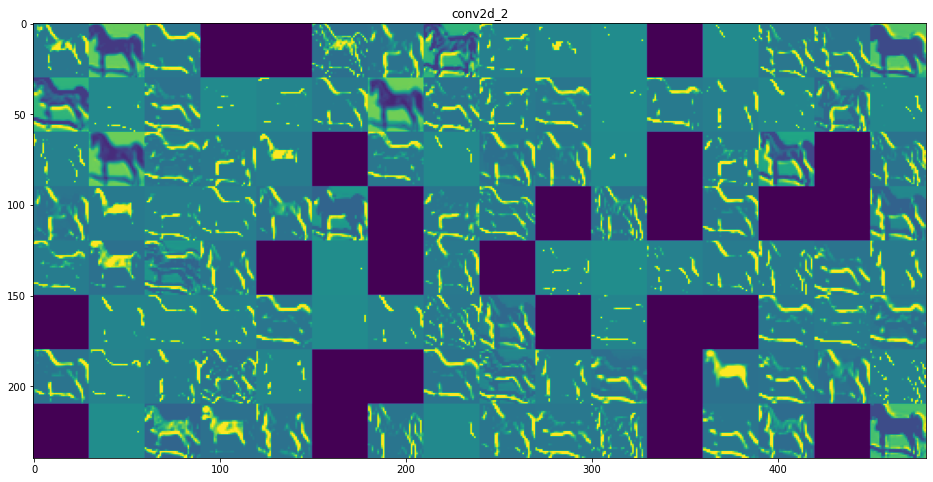

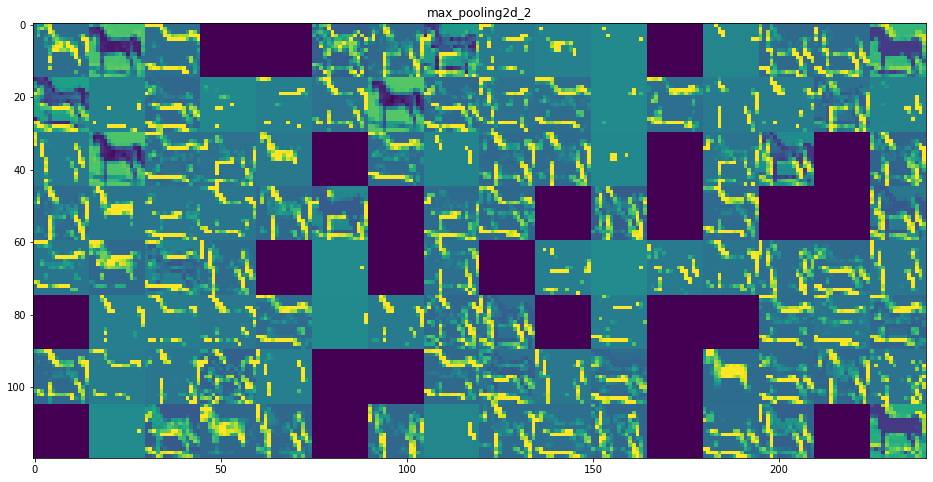

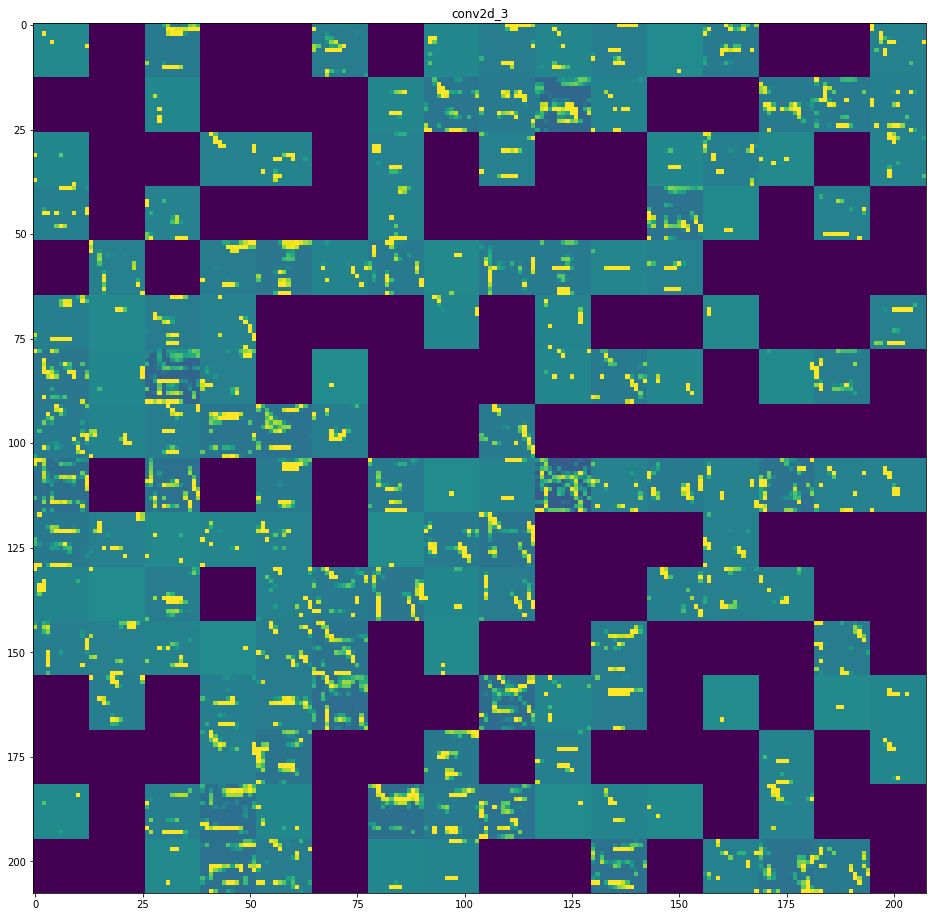

In [ ]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model_5_23.layers[:3]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations_5_23):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show();

#### Model 5.3.4

Same as model 5.3 with udpated dropout (0.5)

In [183]:
## Build CNN

model_5_34 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]), # Layer 1 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.5), # Layer 1 end
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu), # Layer 2 start
  MaxPool2D((2, 2),strides=2), 
  Dropout(0.5), # Layer 2 end
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)), # Classification 
  Dense(units=10, activation=tf.nn.softmax)       
])

model_5_34.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 15, 15, 128)      0         
 g2D)                                                            
                                                                 
 dropout_20 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 6, 6, 256)        0         
 g2D)                                                            
                                                                 
 dropout_21 (Dropout)        (None, 6, 6, 256)       

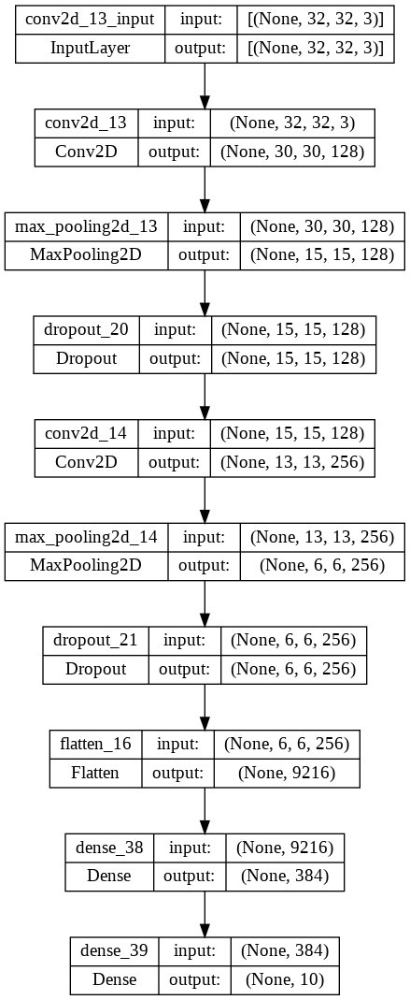

In [184]:
keras.utils.plot_model(model_5_34, "CIFAR10.png", show_shapes=True) 

In [185]:
## Compile

model_5_34.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [186]:
## Train 
time = perf_counter()

history_5_34 = model_5_34.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_34.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 8s 10ms/step - loss: 2.1649 - accuracy: 0.1704 - val_loss: 2.0489 - val_accuracy: 0.1820
Epoch 2/200
704/704 [==============================] - 7s 10ms/step - loss: 2.0123 - accuracy: 0.1853 - val_loss: 1.9623 - val_accuracy: 0.2016
Epoch 3/200
704/704 [==============================] - 7s 10ms/step - loss: 1.9415 - accuracy: 0.2300 - val_loss: 1.8960 - val_accuracy: 0.2550
Epoch 4/200
704/704 [==============================] - 7s 10ms/step - loss: 1.8559 - accuracy: 0.2622 - val_loss: 1.8257 - val_accuracy: 0.2606
Epoch 5/200
704/704 [==============================] - 7s 10ms/step - loss: 1.7931 - accuracy: 0.2811 - val_loss: 1.7662 - val_accuracy: 0.2936
Epoch 6/200
704/704 [==============================] - 7s 10ms/step - loss: 1.7525 - accuracy: 0.3085 - val_loss: 1.7318 - val_accuracy: 0.3298
Epoch 7/200
704/704 [==============================] - 7s 10ms/step - loss: 1.6734 - accuracy: 0.3399 - val_loss: 1.6701 - val_accuracy:

In [187]:
time_5_34 = perf_counter() - time
print(time_5_34)

173.64417600099978


In [188]:
## Evaluate

model_5_34 = tf.keras.models.load_model("CNN_model_5_34.h5")
print(f"Test acc: {model_5_34.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 3ms/step - loss: 1.3123 - accuracy: 0.5194
Test acc: 0.519


#### Model 5.4 
Same as Model 4 with regularization

In [189]:
## Build CNN

model_5_4 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.3),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.3),
  Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.3),
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)),
  BatchNormalization(),
  Dropout(0.3),
  Dense(units=10, activation=tf.nn.softmax)       
])
model_5_4.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 15, 15, 128)      0         
 g2D)                                                            
                                                                 
 dropout_22 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 6, 6, 256)        0         
 g2D)                                                            
                                                                 
 dropout_23 (Dropout)        (None, 6, 6, 256)       

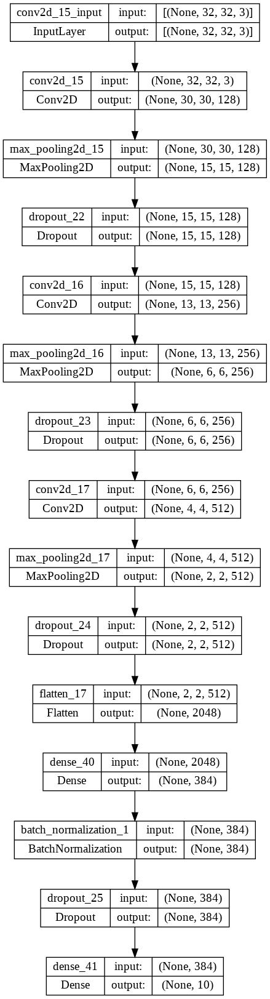

In [190]:
keras.utils.plot_model(model_5_4, "CIFAR10.png", show_shapes=True) 

In [191]:
## Compile
model_5_4.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [192]:
## Train
time = perf_counter()

history_5_4 = model_5_4.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_4.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 9s 12ms/step - loss: 1.6822 - accuracy: 0.4147 - val_loss: 1.4389 - val_accuracy: 0.5260
Epoch 2/200
704/704 [==============================] - 8s 12ms/step - loss: 1.3285 - accuracy: 0.5599 - val_loss: 1.1740 - val_accuracy: 0.6096
Epoch 3/200
704/704 [==============================] - 8s 12ms/step - loss: 1.1813 - accuracy: 0.6205 - val_loss: 1.2172 - val_accuracy: 0.5952
Epoch 4/200
704/704 [==============================] - 8s 12ms/step - loss: 1.0920 - accuracy: 0.6560 - val_loss: 1.0102 - val_accuracy: 0.6776
Epoch 5/200
704/704 [==============================] - 8s 12ms/step - loss: 1.0220 - accuracy: 0.6818 - val_loss: 0.9277 - val_accuracy: 0.7098
Epoch 6/200
704/704 [==============================] - 8s 12ms/step - loss: 0.9703 - accuracy: 0.7027 - val_loss: 0.9268 - val_accuracy: 0.7156
Epoch 7/200
704/704 [==============================] - 8s 12ms/step - loss: 0.9310 - accuracy: 0.7151 - val_loss: 0.8878 - val_accuracy:

In [193]:
time_5_4 = perf_counter() - time
print(time_5_4)

143.969121998


In [194]:
## Evalute

model_5_4 = tf.keras.models.load_model("CNN_model_5_4.h5")
print(f"Test acc: {model_4.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 4ms/step - loss: 0.8886 - accuracy: 0.7490
Test acc: 0.749


#### Model 5.4.1
Same as Model 5.4 + updated dropout (0.1)

In [195]:
## Build CNN

model_5_41 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)),
  BatchNormalization(),
  Dropout(0.1),
  Dense(units=10, activation=tf.nn.softmax)       
])
model_5_41.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 15, 15, 128)      0         
 g2D)                                                            
                                                                 
 dropout_26 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_19 (Conv2D)          (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 6, 6, 256)        0         
 g2D)                                                            
                                                                 
 dropout_27 (Dropout)        (None, 6, 6, 256)       

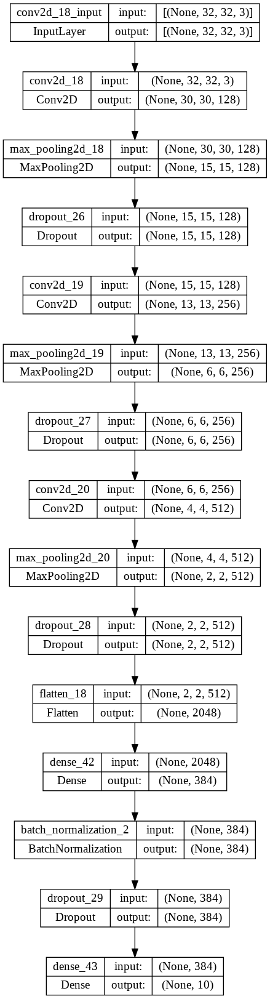

In [196]:
keras.utils.plot_model(model_5_41, "CIFAR10.png", show_shapes=True) 

In [197]:
## Compile
model_5_41.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [198]:
## Train
time = perf_counter()

history_5_41 = model_5_41.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_41.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 10s 13ms/step - loss: 1.5496 - accuracy: 0.4599 - val_loss: 1.2702 - val_accuracy: 0.5580
Epoch 2/200
704/704 [==============================] - 8s 12ms/step - loss: 1.1655 - accuracy: 0.6112 - val_loss: 1.0721 - val_accuracy: 0.6418
Epoch 3/200
704/704 [==============================] - 8s 12ms/step - loss: 0.9847 - accuracy: 0.6800 - val_loss: 0.9620 - val_accuracy: 0.6854
Epoch 4/200
704/704 [==============================] - 8s 12ms/step - loss: 0.8742 - accuracy: 0.7240 - val_loss: 0.9157 - val_accuracy: 0.7186
Epoch 5/200
704/704 [==============================] - 8s 12ms/step - loss: 0.7831 - accuracy: 0.7581 - val_loss: 0.8740 - val_accuracy: 0.7274
Epoch 6/200
704/704 [==============================] - 8s 12ms/step - loss: 0.7149 - accuracy: 0.7819 - val_loss: 0.9357 - val_accuracy: 0.7084
Epoch 7/200
704/704 [==============================] - 8s 12ms/step - loss: 0.6536 - accuracy: 0.8033 - val_loss: 0.8460 - val_accuracy

In [199]:
time_5_41 = perf_counter() - time
print(time_5_41)

118.5523509059999


In [200]:
## Evalute

model_5_41 = tf.keras.models.load_model("CNN_model_5_41.h5")
print(f"Test acc: {model_5_41.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 4ms/step - loss: 0.8450 - accuracy: 0.7630
Test acc: 0.763


#### Model 5.4.2 - BEST MODEL of 4
Same as Model 5.4.2 + L2 kernel regularizer

In [201]:
## Build CNN

model_5_42 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)),
  BatchNormalization(),
  Dropout(0.1),
  Dense(units=10, activation=tf.nn.sigmoid)       
])
model_5_42.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 15, 15, 128)      0         
 g2D)                                                            
                                                                 
 dropout_30 (Dropout)        (None, 15, 15, 128)       0         
                                                                 
 conv2d_22 (Conv2D)          (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 6, 6, 256)        0         
 g2D)                                                            
                                                                 
 dropout_31 (Dropout)        (None, 6, 6, 256)       

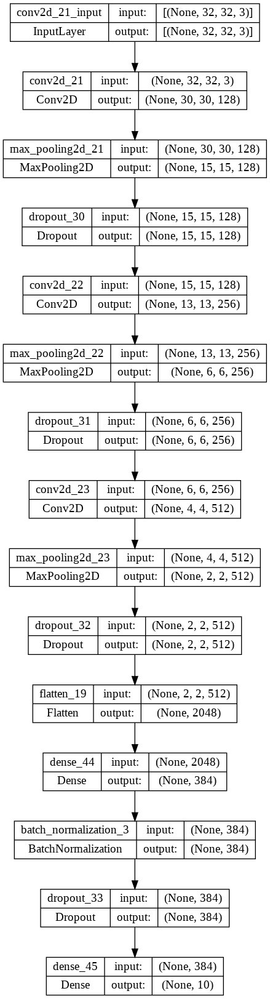

In [202]:
keras.utils.plot_model(model_5_42, "CIFAR10.png", show_shapes=True) 

In [203]:
## Compile
model_5_42.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [204]:
## Train
time = perf_counter()

history_5_42 = model_5_42.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_42.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 10s 12ms/step - loss: 1.5973 - accuracy: 0.4360 - val_loss: 1.3574 - val_accuracy: 0.5322
Epoch 2/200
704/704 [==============================] - 8s 12ms/step - loss: 1.1593 - accuracy: 0.6113 - val_loss: 1.0314 - val_accuracy: 0.6660
Epoch 3/200
704/704 [==============================] - 8s 12ms/step - loss: 0.9905 - accuracy: 0.6786 - val_loss: 0.9723 - val_accuracy: 0.6860
Epoch 4/200
704/704 [==============================] - 8s 12ms/step - loss: 0.8775 - accuracy: 0.7212 - val_loss: 1.1553 - val_accuracy: 0.6566
Epoch 5/200
704/704 [==============================] - 8s 12ms/step - loss: 0.7834 - accuracy: 0.7536 - val_loss: 0.8389 - val_accuracy: 0.7356
Epoch 6/200
704/704 [==============================] - 8s 12ms/step - loss: 0.7103 - accuracy: 0.7839 - val_loss: 0.9189 - val_accuracy: 0.7200
Epoch 7/200
704/704 [==============================] - 8s 12ms/step - loss: 0.6547 - accuracy: 0.8033 - val_loss: 0.8255 - val_accuracy

In [205]:
time_5_42 = perf_counter() - time
print(time_5_42)

85.60984257499967


In [206]:
## Evalute

model_5_42 = tf.keras.models.load_model("CNN_model_5_42.h5")
print(f"Test acc: {model_5_42.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 4ms/step - loss: 0.8603 - accuracy: 0.7415
Test acc: 0.742


#### Model 5.4.3
Same as Model 5.4.2 + updated output activation = sigmoid

In [207]:
## Build CNN

model_5_43 = Sequential([
  Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=x_train_norm.shape[1:]),
  MaxPool2D((2, 2),strides=2),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu, kernel_regularizer=l2(0.001)),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.1),
  Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu, kernel_regularizer=l2(0.001)),
  MaxPool2D((2, 2),strides=2),
  Flatten(),
  Dense(units=384,activation=tf.nn.softmax,kernel_regularizer=tf.keras.regularizers.L2(0.001)),
  BatchNormalization(),
  Dropout(0.1),
  Dense(units=10, activation=tf.nn.sigmoid)       
])
model_5_43.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 30, 30, 128)       3584      
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 15, 15, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 13, 13, 256)       295168    
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 6, 6, 256)        0         
 g2D)                                                            
                                                                 
 dropout_34 (Dropout)        (None, 6, 6, 256)         0         
                                                                 
 conv2d_26 (Conv2D)          (None, 4, 4, 512)       

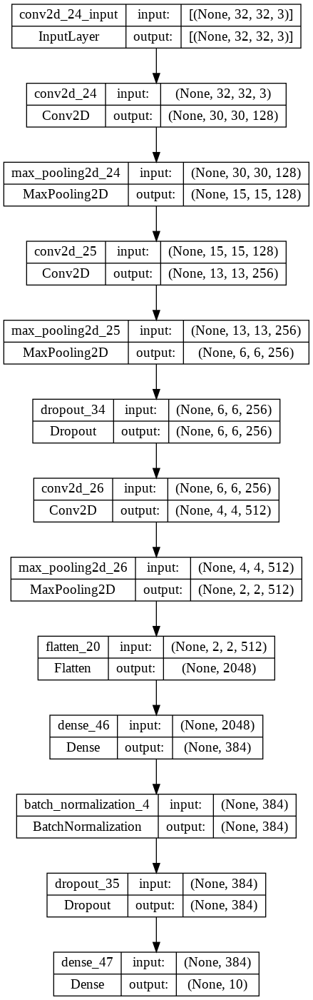

In [208]:
keras.utils.plot_model(model_5_43, "CIFAR10.png", show_shapes=True) 

In [209]:
## Compile
model_5_43.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [210]:
## Train
time = perf_counter()

history_5_43 = model_5_43.fit(x_train_norm
                    ,y_train_split
                    ,epochs=200
                    ,batch_size=64
                    ,validation_data=(x_valid_norm, y_valid_split)
                    ,callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("CNN_model_5_43.h5",save_best_only=True,save_weights_only=False) 
                     ,tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]                                                                                                           
                   )

Epoch 1/200
704/704 [==============================] - 9s 12ms/step - loss: 1.7761 - accuracy: 0.3870 - val_loss: 1.5205 - val_accuracy: 0.4874
Epoch 2/200
704/704 [==============================] - 8s 12ms/step - loss: 1.3985 - accuracy: 0.5567 - val_loss: 1.6469 - val_accuracy: 0.5008
Epoch 3/200
704/704 [==============================] - 8s 12ms/step - loss: 1.2694 - accuracy: 0.6213 - val_loss: 1.3125 - val_accuracy: 0.6132
Epoch 4/200
704/704 [==============================] - 8s 12ms/step - loss: 1.1916 - accuracy: 0.6576 - val_loss: 1.2695 - val_accuracy: 0.6468
Epoch 5/200
704/704 [==============================] - 8s 12ms/step - loss: 1.1282 - accuracy: 0.6902 - val_loss: 1.4173 - val_accuracy: 0.6102
Epoch 6/200
704/704 [==============================] - 8s 12ms/step - loss: 1.0844 - accuracy: 0.7068 - val_loss: 1.1151 - val_accuracy: 0.6974
Epoch 7/200
704/704 [==============================] - 8s 12ms/step - loss: 1.0389 - accuracy: 0.7293 - val_loss: 1.0874 - val_accuracy:

In [211]:
time_5_43 = perf_counter() - time
print(time_5_43)

108.52179241900012


In [212]:
## Evalute

model_5_43 = tf.keras.models.load_model("CNN_model_5_43.h5")
print(f"Test acc: {model_5_43.evaluate(x_test_norm, y_test)[1]:.3f}")

313/313 [==============================] - 1s 4ms/step - loss: 1.0953 - accuracy: 0.7118
Test acc: 0.712
